In [2]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats

In [4]:
df= pd.read_csv('ecommerce_sales_analysis.csv')

In [6]:
df.head()

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12
0,1,Product_1,Clothing,190.40,1.7,220,479,449,92,784,604,904,446,603,807,252,695,306
1,2,Product_2,Home & Kitchen,475.60,3.2,903,21,989,861,863,524,128,610,436,176,294,772,353
2,3,Product_3,Toys,367.34,4.5,163,348,558,567,143,771,409,290,828,340,667,267,392
3,4,Product_4,Toys,301.34,3.9,951,725,678,59,15,937,421,670,933,56,157,168,203
4,5,Product_5,Books,82.23,4.2,220,682,451,649,301,620,293,411,258,854,548,770,257


In [8]:
df.tail()

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12
995,996,Product_996,Home & Kitchen,50.33,3.6,494,488,359,137,787,678,970,282,155,57,575,634,393
996,997,Product_997,Home & Kitchen,459.07,4.8,701,18,906,129,78,19,110,403,683,104,858,729,474
997,998,Product_998,Sports,72.73,1.3,287,725,109,193,657,215,337,664,476,265,344,888,654
998,999,Product_999,Sports,475.37,1.2,720,196,191,315,622,854,122,65,938,521,268,60,394
999,1000,Product_1000,Toys,225.77,2.1,114,890,903,983,769,134,704,648,400,495,839,611,110


In [10]:
df.shape

(1000, 18)

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
product_id,1000.0,500.50000,288.819436,1.00,250.75,500.50,750.250,1000.00
price,1000.0,247.67713,144.607983,7.29,121.81,250.92,373.435,499.86
review_score,1000.0,3.02760,1.171243,1.00,2.00,3.10,4.000,5.00
review_count,1000.0,526.50600,282.269932,1.00,283.75,543.00,772.000,999.00
sales_month_1,1000.0,498.30600,289.941478,0.00,245.50,507.50,740.750,1000.00
sales_month_2,1000.0,507.66100,285.992689,2.00,262.50,508.00,756.250,1000.00
sales_month_3,1000.0,506.73900,294.010873,0.00,243.75,493.00,777.250,999.00
sales_month_4,1000.0,503.82300,286.645567,0.00,261.50,501.50,749.500,1000.00
sales_month_5,1000.0,487.19400,287.844324,0.00,221.00,497.00,727.000,1000.00
sales_month_6,1000.0,491.65300,289.234018,0.00,236.00,479.50,740.500,1000.00


In [14]:
df.isnull().sum()

product_id        0
product_name      0
category          0
price             0
review_score      0
review_count      0
sales_month_1     0
sales_month_2     0
sales_month_3     0
sales_month_4     0
sales_month_5     0
sales_month_6     0
sales_month_7     0
sales_month_8     0
sales_month_9     0
sales_month_10    0
sales_month_11    0
sales_month_12    0
dtype: int64

Explanatory Data Analysis

In [17]:
df['category'].unique()

array(['Clothing', 'Home & Kitchen', 'Toys', 'Books', 'Electronics',
       'Health', 'Sports'], dtype=object)

In [19]:
df['category'].value_counts()

category
Books             154
Sports            153
Toys              151
Clothing          140
Health            139
Electronics       138
Home & Kitchen    125
Name: count, dtype: int64

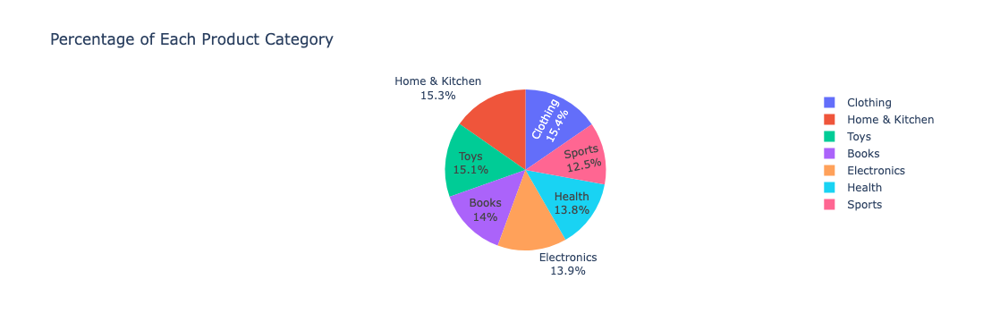

In [21]:
#Graph of percentage of each product category
fig = px.pie(values = df['category'].value_counts(), names = df['category'].unique(),
            title = 'Percentage of Each Product Category')
fig.update_traces(textinfo = 'label+percent')
fig.show()

In [23]:
#Creating a new column total sales by summing the sales over the past year
df['total_sales'] = df[['sales_month_1', 'sales_month_2', 'sales_month_3', 
                        'sales_month_4', 'sales_month_5', 'sales_month_6', 
                        'sales_month_7', 'sales_month_8', 'sales_month_9', 
                        'sales_month_10', 'sales_month_11', 'sales_month_12']].sum(axis = 1)
df.head()

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
0,1,Product_1,Clothing,190.40,1.7,220,479,449,92,784,604,904,446,603,807,252,695,306,6421
1,2,Product_2,Home & Kitchen,475.60,3.2,903,21,989,861,863,524,128,610,436,176,294,772,353,6027
2,3,Product_3,Toys,367.34,4.5,163,348,558,567,143,771,409,290,828,340,667,267,392,5580
3,4,Product_4,Toys,301.34,3.9,951,725,678,59,15,937,421,670,933,56,157,168,203,5022
4,5,Product_5,Books,82.23,4.2,220,682,451,649,301,620,293,411,258,854,548,770,257,6094


In [25]:
#Creating a new dataframe with total sales
new_df = df[['product_name', 'category', 'price', 'review_score', 'review_count', 'total_sales']]
new_df.head(10)

,product_name,category,price,review_score,review_count,total_sales
0,Product_1,Clothing,190.40,1.7,220,6421
1,Product_2,Home & Kitchen,475.60,3.2,903,6027
2,Product_3,Toys,367.34,4.5,163,5580
3,Product_4,Toys,301.34,3.9,951,5022
4,Product_5,Books,82.23,4.2,220,6094
5,Product_6,Toys,82.22,3.6,270,6453
6,Product_7,Electronics,33.75,3.8,632,5298
7,Product_8,Electronics,433.76,4.4,906,4769
8,Product_9,Electronics,302.55,2.0,848,5677
9,Product_10,Clothing,355.50,3.0,400,4879


In [27]:
sales_max = np.max(new_df['total_sales'])
print("Maximum total sales is: ", sales_max, "units")

Maximum total sales is:  9151 units


In [29]:
category_max = new_df.groupby('category')['total_sales'].max().idxmax()
print("Product category with maximum sales is: ", category_max)

Product category with maximum sales is:  Electronics


In [31]:
new_df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,1000.0,247.67713,144.607983,7.29,121.81,250.92,373.435,499.86
review_score,1000.0,3.02760,1.171243,1.00,2.00,3.10,4.000,5.00
review_count,1000.0,526.50600,282.269932,1.00,283.75,543.00,772.000,999.00
total_sales,1000.0,6019.91200,992.273787,2972.00,5392.00,5992.00,6680.000,9151.00


In [33]:
#Top performing product
product = new_df.groupby('product_name').sum()
product_10 = product.sort_values(['total_sales'], ascending = False).head(10)
product_10

,category,price,review_score,review_count,total_sales
product_name,,,,,
Product_224,Electronics,187.02,4.8,613,9151
Product_286,Clothing,22.79,3.1,728,8921
Product_734,Health,263.92,2.7,30,8914
Product_905,Sports,213.61,4.0,520,8783
Product_180,Sports,73.07,3.2,268,8775
Product_853,Books,108.90,4.4,305,8765
Product_239,Health,324.51,4.9,575,8724
Product_924,Electronics,400.93,2.4,758,8525
Product_937,Electronics,14.10,2.1,883,8459


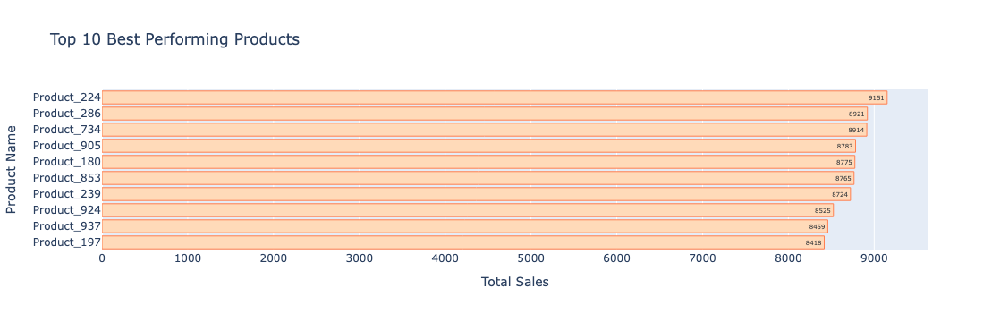

In [35]:
#Graph of 10 best performing products
fig = px.bar(x = product_10['total_sales'], y = product_10.index, 
            title = 'Top 10 Best Performing Products', text_auto = True)
fig.update_traces(orientation = 'h', marker_color = 'peachpuff', 
                  marker_line_color = 'coral', marker_line_width = 1)
fig.update_xaxes(title = 'Total Sales')
fig.update_yaxes(title = 'Product Name')
fig.update_layout(yaxis = {'categoryorder' : 'total ascending'})
fig.show()

In [37]:
#Least performing product
product_last = new_df.groupby('product_name').sum()
product_last_10 = product_last.sort_values(['total_sales'], ascending = True).head(10)
product_last_10

,category,price,review_score,review_count,total_sales
product_name,,,,,
Product_123,Health,162.41,4.4,650,2972
Product_692,Toys,215.59,3.0,514,3162
Product_786,Books,454.68,4.6,325,3286
Product_666,Home & Kitchen,80.67,4.4,655,3301
Product_136,Home & Kitchen,164.99,1.3,68,3391
Product_179,Sports,468.68,4.0,504,3443
Product_95,Electronics,386.63,1.9,610,3539
Product_815,Health,435.60,1.3,234,3551
Product_544,Clothing,337.49,2.0,913,3564


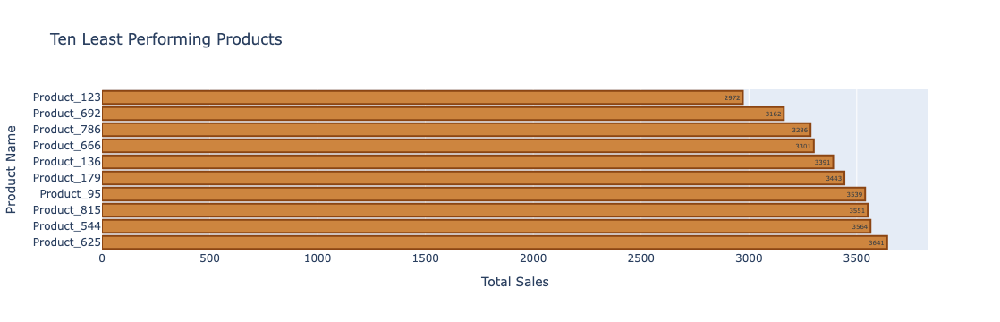

In [39]:
#Graph of least performing products
fig = px.bar(x = product_last_10['total_sales'], y = product_last_10.index, 
            title = 'Ten Least Performing Products', text_auto = True)
fig.update_traces(orientation = 'h', marker_color = 'peru', 
                  marker_line_color = 'saddlebrown', marker_line_width = 2)
fig.update_xaxes(title = 'Total Sales')
fig.update_yaxes(title = 'Product Name')
fig.update_layout(yaxis = {'categoryorder' : 'total descending'})
fig.show()

Monthly Sales Analysis

In [42]:
#Top performing product category in sales month 1
sm_1 = df.groupby('category')[['sales_month_1']].sum()
sm1_1 = sm_1.sort_values(by = ['sales_month_1'], ascending = False)
sm1_1

,sales_month_1
category,
Toys,79836
Books,77932
Sports,77737
Electronics,76347
Health,67644
Clothing,60966
Home & Kitchen,57844


In [44]:
##Top performing product category in sales month 2
sm_2 = df.groupby('category')[['sales_month_2']].sum()
sm2_2 = sm_2.sort_values(by = ['sales_month_2'], ascending = False)
sm2_2

,sales_month_2
category,
Sports,82244
Toys,80271
Books,80079
Electronics,72472
Clothing,67911
Health,67432
Home & Kitchen,57252


In [46]:
#Top performing product category in sales month 3
sm_3 = df.groupby('category')[['sales_month_3']].sum()
sm3_3 = sm_3.sort_values(by = ['sales_month_3'], ascending = False)
sm3_3

,sales_month_3
category,
Books,76998
Toys,76859
Clothing,76796
Sports,75109
Electronics,70708
Health,67602
Home & Kitchen,62667


In [48]:
#Top performing product category in sales month 4
sm_4 = df.groupby('category')[['sales_month_4']].sum()
sm4_4 = sm_4.sort_values(by=['sales_month_4'], ascending= False)
sm4_4

,sales_month_4
category,
Books,74699
Sports,74287
Toys,73278
Electronics,73158
Health,72925
Clothing,70088
Home & Kitchen,65388


In [50]:
#Top performing product category in sales month 5
sm_5 = df.groupby('category')[['sales_month_5']].sum()
sm5_5=sm_5.sort_values(by=['sales_month_5'], ascending= False)
sm5_5

,sales_month_5
category,
Books,79051
Sports,73467
Electronics,72169
Toys,71920
Health,69178
Clothing,61643
Home & Kitchen,59766


In [52]:
#Top performing product category in sales month 6
sm_6= df.groupby('category')[['sales_month_6']].sum()
sm6_6=sm_6.sort_values(by=['sales_month_6'], ascending= False)
sm6_6

,sales_month_6
category,
Toys,79090
Books,76644
Sports,75641
Electronics,70060
Health,63926
Home & Kitchen,63169
Clothing,63123


In [54]:
#Top peforming product category in sales month 7
sm_7= df.groupby('category')[['sales_month_7']].sum()
sm7_7=sm_7.sort_values(by=['sales_month_7'], ascending=False)
sm7_7

,sales_month_7
category,
Books,79114
Toys,77102
Sports,77082
Health,75256
Electronics,72223
Clothing,66105
Home & Kitchen,60129


In [56]:
#Top performing product category in sales month 8
sm_8 = df.groupby('category')[['sales_month_8']].sum()
sm8_8 = sm_8.sort_values(by = ['sales_month_8'], ascending = False)
sm8_8

,sales_month_8
category,
Toys,78205
Books,78108
Clothing,74422
Sports,73912
Health,69126
Electronics,65754
Home & Kitchen,65042


In [58]:
#Top performing product category in sales month 9
sm_9 = df.groupby('category')[['sales_month_9']].sum()
sm9_9 = sm_9.sort_values(by = ['sales_month_9'], ascending = False)
sm9_9

,sales_month_9
category,
Sports,79209
Books,77211
Clothing,72675
Toys,70209
Electronics,69914
Health,64581
Home & Kitchen,58135


In [60]:
#Top performing product category in sales month 10
sm_10 = df.groupby('category')[['sales_month_10']].sum()
sm10_10 = sm_10.sort_values(by = ['sales_month_10'], ascending = False)
sm10_10

,sales_month_10
category,
Books,83504
Sports,80187
Toys,74664
Health,72613
Electronics,70148
Clothing,68806
Home & Kitchen,64876


In [62]:
#Top performing product category in sales month 11
sm_11 = df.groupby('category')[['sales_month_11']].sum()
sm11_11 = sm_11.sort_values(by = ['sales_month_11'], ascending = False)
sm11_11

,sales_month_11
category,
Books,76557
Toys,76399
Sports,74270
Health,72500
Clothing,71683
Electronics,68148
Home & Kitchen,66281


In [64]:
#Top performing product category in sales month 12
sm_12 = df.groupby('category')[['sales_month_12']].sum()
sm12_12 = sm_12.sort_values(by = ['sales_month_12'], ascending = False)
sm12_12

,sales_month_12
category,
Toys,79268
Books,78332
Sports,73226
Clothing,72318
Health,71631
Electronics,64019
Home & Kitchen,61592


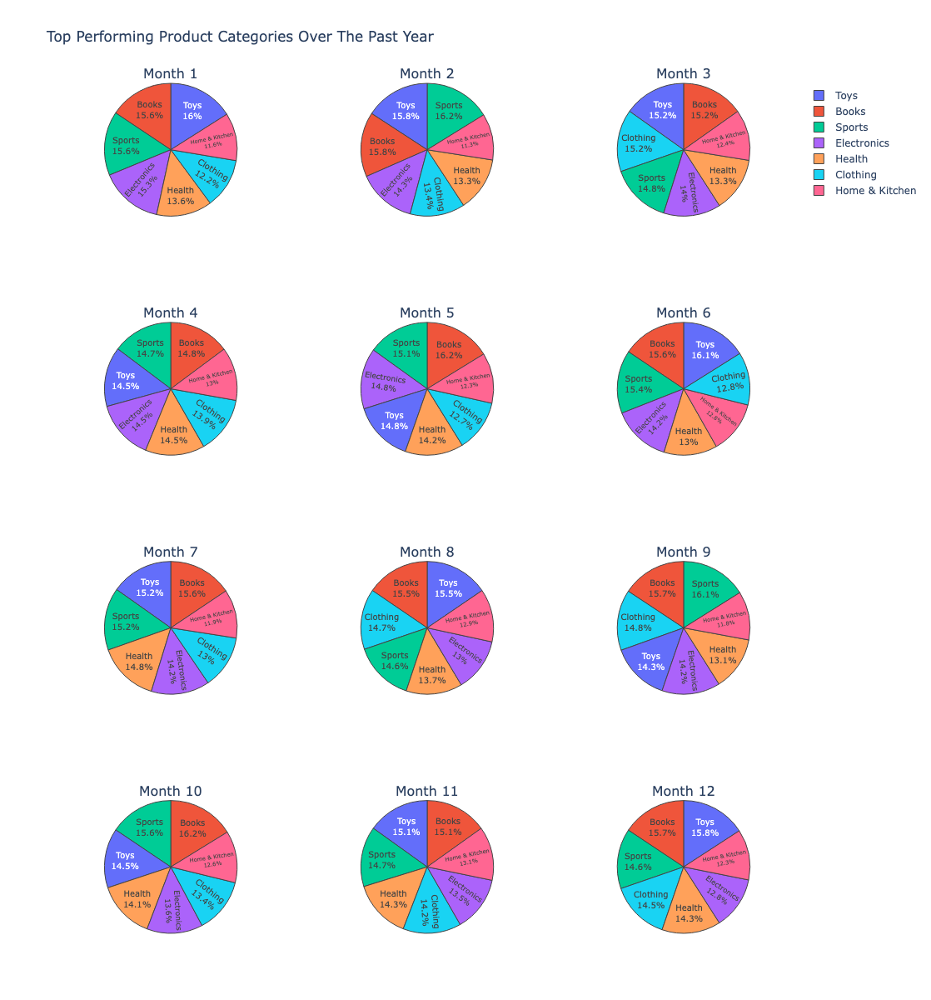

In [66]:
#Graph of Top performing product categories Over The Past Year
fig = make_subplots(rows = 4, cols = 3, 
                    specs=[[{"type": "pie"}, {"type": "pie"}, {"type": "pie"}],
                           [{"type": "pie"}, {"type": "pie"}, {"type": "pie"}],
                           [{"type": "pie"}, {"type": "pie"}, {"type": "pie"}],
                           [{"type": "pie"}, {"type": "pie"}, {"type": "pie"}]],
                           
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.pie(values = sm1_1['sales_month_1'], names = sm1_1.index)
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig2 = px.pie(values = sm2_2['sales_month_2'], names = sm2_2.index)
for trace in fig2.data:
    fig.add_trace(fig2.data[0], row=1, col=2)

fig3 = px.pie(values = sm3_3['sales_month_3'], names = sm3_3.index)
for trace in fig3.data:
    fig.add_trace(fig3.data[0], row=1, col=3)

fig4 = px.pie(values = sm4_4['sales_month_4'], names = sm4_4.index)
for trace in fig4.data:
    fig.add_trace(fig4.data[0], row=2, col=1)    

fig5 = px.pie(values = sm5_5['sales_month_5'], names = sm5_5.index)
for trace in fig5.data:
    fig.add_trace(fig5.data[0], row=2, col=2)
    
fig6 = px.pie(values = sm6_6['sales_month_6'], names = sm6_6.index)
for trace in fig6.data:
    fig.add_trace(fig6.data[0], row=2, col=3)
    
fig7 = px.pie(values = sm7_7['sales_month_7'], names = sm7_7.index)
for trace in fig7.data:
    fig.add_trace(fig7.data[0], row=3, col=1)
    
fig8 = px.pie(values = sm8_8['sales_month_8'], names = sm8_8.index)
for trace in fig8.data:
    fig.add_trace(fig8.data[0], row=3, col=2)
    
fig9 = px.pie(values = sm9_9['sales_month_9'], names = sm9_9.index)
for trace in fig9.data:
    fig.add_trace(fig9.data[0], row=3, col=3)
    
fig10 = px.pie(values = sm10_10['sales_month_10'], names = sm10_10.index)
for trace in fig10.data:
    fig.add_trace(fig10.data[0], row=4, col=1)
    
fig11 = px.pie(values = sm11_11['sales_month_11'], names = sm11_11.index)
for trace in fig11.data:
    fig.add_trace(fig11.data[0], row=4, col=2)

fig12 = px.pie(values = sm12_12['sales_month_12'], names = sm12_12.index)
for trace in fig12.data:
    fig.add_trace(fig12.data[0], row=4, col=3)
    
    
fig.update_traces(marker_line_width = 1, textinfo = 'label+percent',textposition = "inside", textfont_size = 10)
fig.update_layout(title = 'Top Performing Product Categories Over The Past Year',
                  height = 1200)
fig.show()

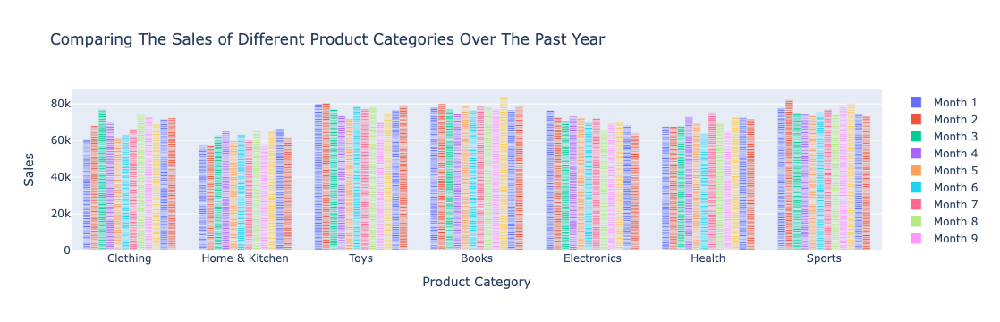

In [68]:
#Graph comparing the sales of each product category 
fig = go.Figure()
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_1'], name = 'Month 1'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_2'], name = 'Month 2'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_3'], name = 'Month 3'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_4'], name = 'Month 4'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_5'], name = 'Month 5'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_6'], name = 'Month 6'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_7'], name = 'Month 7'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_8'], name = 'Month 8'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_9'], name = 'Month 9'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_10'], name = 'Month10'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_11'], name = 'Month 11'))
fig.add_trace(go.Bar(x = df['category'], y = df['sales_month_12'], name = 'Month 12'))
fig.update_xaxes(title = 'Product Category')
fig.update_yaxes(title = 'Sales')
fig.update_layout(barmode = 'group', title = 'Comparing The Sales of Different Product Categories Over The Past Year')
fig.show()

Exploring Relation Between Price and Sales Based on Review Score

In [71]:
correlation = df.corr(numeric_only = True)
correlation

,product_id,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
product_id,1.000000,-0.024495,-0.040197,-0.008827,0.018804,0.077879,0.032606,-0.029126,-0.005238,-0.024078,0.046554,-0.000281,-0.049009,0.023967,0.044788,-0.028809,0.031946
price,-0.024495,1.000000,0.028960,0.042189,-0.033860,-0.002978,-0.023203,0.044579,0.030024,-0.051430,-0.027996,-0.045065,-0.008224,0.038288,0.007972,0.019081,-0.015978
review_score,-0.040197,0.028960,1.000000,0.027351,0.023949,-0.076709,-0.012420,-0.016875,-0.038930,0.017519,-0.005810,0.020471,0.019554,0.015707,0.002724,-0.012969,-0.018186
review_count,-0.008827,0.042189,0.027351,1.000000,-0.019286,-0.036431,-0.029381,-0.021719,-0.013798,-0.006579,0.029836,-0.000519,-0.020332,-0.063471,-0.031269,-0.026710,-0.069393
sales_month_1,0.018804,-0.033860,0.023949,-0.019286,1.000000,0.051889,0.006204,0.048705,0.016276,0.036269,0.034670,0.009454,0.042872,0.002146,0.006124,-0.036595,0.355845
sales_month_2,0.077879,-0.002978,-0.076709,-0.036431,0.051889,1.000000,-0.012759,-0.100955,0.056114,0.035142,-0.040520,-0.022778,0.004930,-0.018488,-0.017643,0.022997,0.275786
sales_month_3,0.032606,-0.023203,-0.012420,-0.029381,0.006204,-0.012759,1.000000,-0.011394,-0.009051,0.018806,-0.034335,-0.056523,-0.034046,0.057530,-0.010934,0.038111,0.281801
sales_month_4,-0.029126,0.044579,-0.016875,-0.021719,0.048705,-0.100955,-0.011394,1.000000,-0.016243,0.046118,0.019064,0.006131,-0.017481,0.039054,0.044536,-0.032976,0.296756
sales_month_5,-0.005238,0.030024,-0.038930,-0.013798,0.016276,0.056114,-0.009051,-0.016243,1.000000,0.036992,-0.013279,-0.012023,-0.020847,0.015713,0.032319,-0.041738,0.303239
sales_month_6,-0.024078,-0.051430,0.017519,-0.006579,0.036269,0.035142,0.018806,0.046118,0.036992,1.000000,-0.007425,-0.050707,0.002852,-0.000288,-0.018171,-0.053489,0.305284


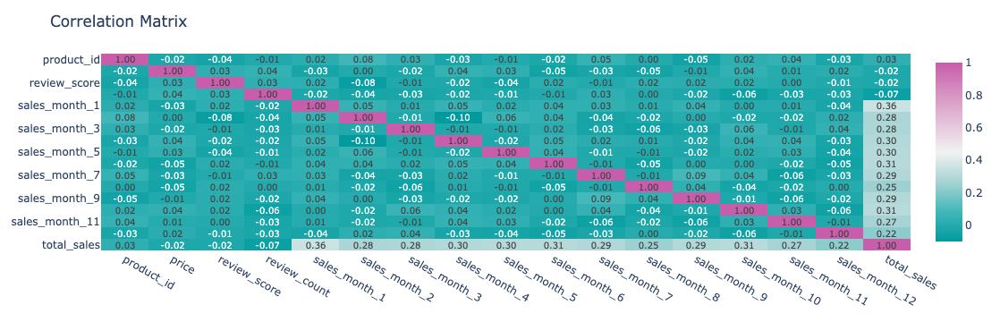

In [73]:
#Correlation Matrix
fig = px.imshow(correlation, text_auto = '.2f', aspect = 'auto', color_continuous_scale = 'tropic')
fig.update_layout(title = 'Correlation Matrix')
fig.show()

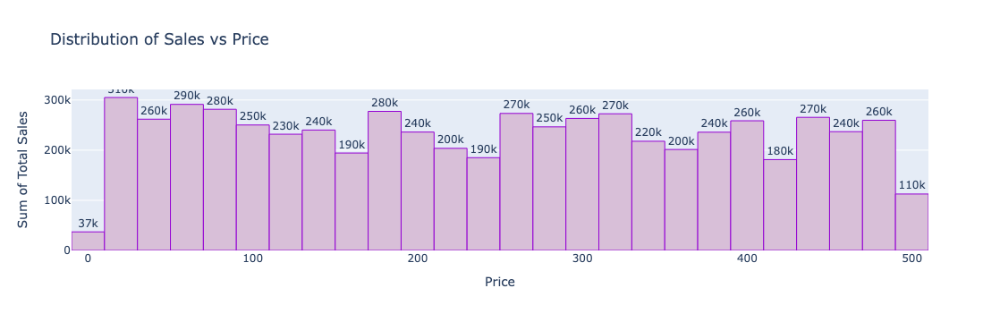

In [75]:
#Impact of price on total sales
fig = px.histogram(new_df, x = 'price', y = 'total_sales', text_auto = '.2s',
                   title = 'Distribution of Sales vs Price')
fig.update_xaxes(title = 'Price')
fig.update_yaxes(title = 'Sum of Total Sales')
fig.update_traces(marker_color = 'thistle',marker_line_color = 'darkviolet',
                  marker_line_width = 1, textposition = "outside")
#fig.update_layout(width = 850)
fig.show()

Monthwise Impact of Price and Sales

In [78]:
#Review score between 1 and 2
review_2 = df[(df['review_score'] >= 1) & (df['review_score']<= 2)] 
review_2

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
0,1,Product_1,Clothing,190.40,1.7,220,479,449,92,784,604,904,446,603,807,252,695,306,6421
8,9,Product_9,Electronics,302.55,2.0,848,809,693,419,106,616,85,42,992,696,298,213,708,5677
10,11,Product_11,Toys,15.19,1.9,182,125,590,12,128,66,841,595,768,737,724,439,341,5366
13,14,Product_14,Books,110.11,1.2,729,203,214,100,340,365,377,50,812,362,55,488,835,4201
16,17,Product_17,Toys,155.60,1.7,556,663,821,515,409,989,50,125,462,355,750,28,92,5259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,986,Product_986,Sports,250.27,1.3,864,923,83,852,387,525,410,752,750,52,159,596,476,5965
991,992,Product_992,Home & Kitchen,348.87,1.6,443,32,295,287,819,660,45,287,559,275,143,958,618,4978
993,994,Product_994,Home & Kitchen,297.16,1.5,13,49,55,186,246,305,602,133,461,30,656,413,706,3842
997,998,Product_998,Sports,72.73,1.3,287,725,109,193,657,215,337,664,476,265,344,888,654,5527


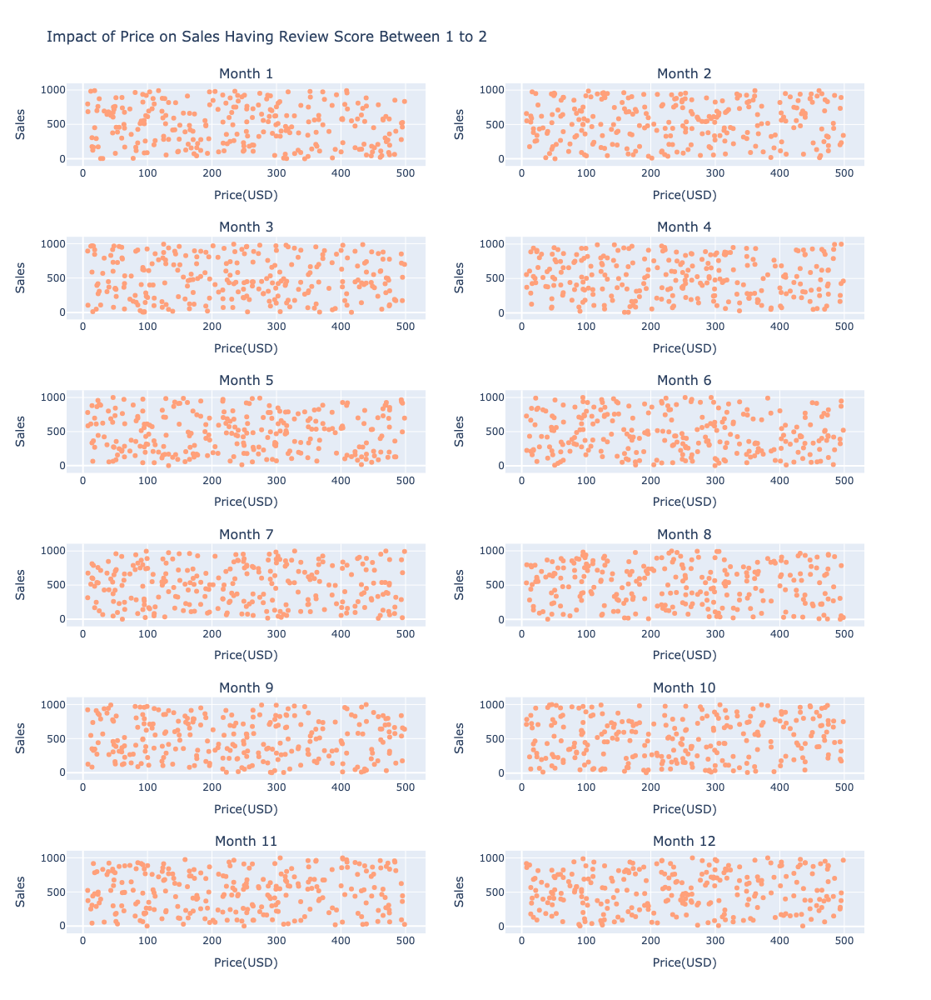

In [80]:
#Graph of impact of price on sales with review score between 1 to 2 
fig = make_subplots(rows = 6, cols = 2,
                   subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                     'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                     'Month 9', 'Month 10', 'Month 11', 'Month 12'))

fig1 = px.scatter(review_2, y = 'sales_month_1', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =1)

fig1 = px.scatter(review_2, y = 'sales_month_2', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =2)

fig1 = px.scatter(review_2, y = 'sales_month_3', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =1)
    
fig1 = px.scatter(review_2, y = 'sales_month_4', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =2)
fig1 = px.scatter(review_2, y = 'sales_month_5', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =1)
    
fig1 = px.scatter(review_2, y = 'sales_month_6', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =2)
    
fig1 = px.scatter(review_2, y = 'sales_month_7', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =1)
    
fig1 = px.scatter(review_2, y = 'sales_month_8', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =2)
    
fig1 = px.scatter(review_2, y = 'sales_month_9', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =1)
fig1 = px.scatter(review_2, y = 'sales_month_10', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =2)
    
fig1 = px.scatter(review_2, y = 'sales_month_11', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =1)
    
fig1 = px.scatter(review_2, y = 'sales_month_12', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =2)

fig.update_traces(marker_color = 'lightsalmon')
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Impact of Price on Sales Having Review Score Between 1 to 2',
                  height = 1200, width = 900)

fig.show()


In [82]:
#Review score between 2 to 3
review_3 = df[(df['review_score'] > 2) & (df['review_score']<= 3)] 
review_3

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
9,10,Product_10,Clothing,355.50,3.0,400,319,390,636,87,7,555,485,566,632,462,561,179,4879
21,22,Product_22,Books,74.05,2.2,619,733,791,382,720,508,265,580,505,22,91,16,636,5249
25,26,Product_26,Clothing,393.66,2.9,875,369,360,470,991,375,247,187,766,748,316,66,265,5160
28,29,Product_29,Books,298.25,2.3,196,112,217,30,987,548,56,414,983,320,981,834,112,5594
36,37,Product_37,Home & Kitchen,155.78,2.4,978,24,324,191,107,823,731,494,231,78,277,922,830,5032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
982,983,Product_983,Home & Kitchen,57.77,2.8,337,96,563,383,620,873,869,423,845,581,830,273,110,6466
983,984,Product_984,Home & Kitchen,42.19,2.9,881,516,782,162,136,459,441,523,151,103,367,406,233,4279
987,988,Product_988,Clothing,220.24,3.0,147,68,804,414,271,437,20,689,318,939,661,38,677,5336
988,989,Product_989,Electronics,126.97,2.7,575,117,637,338,142,753,550,938,368,374,911,104,127,5359


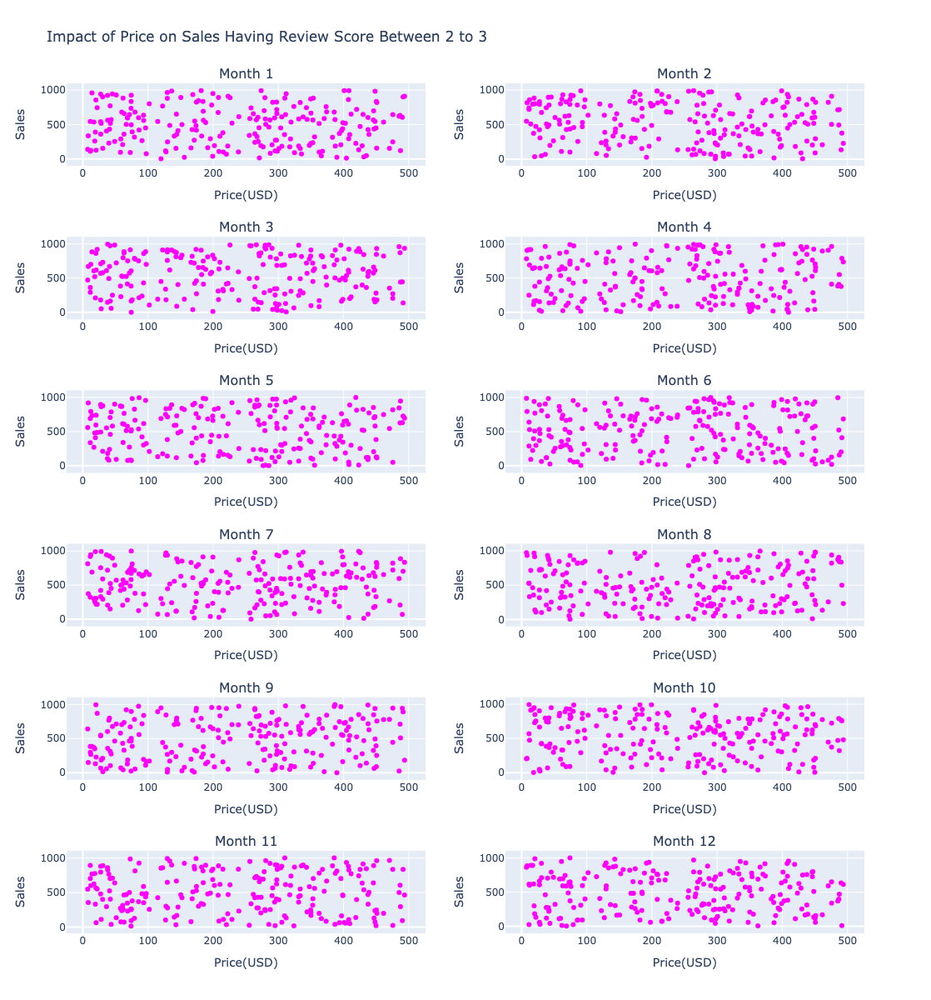

In [84]:
#Graph of impact of price on sales with review score between 2to 3
fig = make_subplots(rows = 6, cols = 2,
                   subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                     'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                     'Month 9', 'Month 10', 'Month 11', 'Month 12'))

fig1 = px.scatter(review_3, y = 'sales_month_1', x = 'price')

for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =1)

fig1 = px.scatter(review_3, y = 'sales_month_2', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =2)

fig1 = px.scatter(review_3, y = 'sales_month_3', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =1)
    
fig1 = px.scatter(review_3, y = 'sales_month_4', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =2)

fig1 = px.scatter(review_3, y = 'sales_month_5', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =1)
    
fig1 = px.scatter(review_3, y = 'sales_month_6', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =2)
    
fig1 = px.scatter(review_3, y = 'sales_month_7', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =1)
    
fig1 = px.scatter(review_3, y = 'sales_month_8', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =2)
    
fig1 = px.scatter(review_3, y = 'sales_month_9', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =1)
    
fig1 = px.scatter(review_3, y = 'sales_month_10', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =2)
fig1 = px.scatter(review_3, y = 'sales_month_11', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =1)
    
fig1 = px.scatter(review_3, y = 'sales_month_12', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =2)
                    
fig.update_traces(marker_color = 'fuchsia')
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Impact of Price on Sales Having Review Score Between 2 to 3',
                  height = 1200, width = 900)

fig.show()

In [85]:
#Review score between 3 and 4
review_4 = df[(df['review_score'] > 3) & (df['review_score']<= 4)] 
review_4

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
1,2,Product_2,Home & Kitchen,475.60,3.2,903,21,989,861,863,524,128,610,436,176,294,772,353,6027
3,4,Product_4,Toys,301.34,3.9,951,725,678,59,15,937,421,670,933,56,157,168,203,5022
5,6,Product_6,Toys,82.22,3.6,270,834,288,38,422,329,245,614,979,851,630,738,485,6453
6,7,Product_7,Electronics,33.75,3.8,632,565,140,539,244,188,700,896,965,447,66,32,516,5298
14,15,Product_15,Clothing,95.00,3.8,205,193,402,793,3,767,389,897,225,891,331,721,252,5864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
986,987,Product_987,Toys,345.76,3.9,840,845,898,188,208,751,992,20,626,973,549,650,416,7116
989,990,Product_990,Electronics,410.46,3.9,806,887,807,606,610,980,734,227,605,841,819,323,236,7675
992,993,Product_993,Home & Kitchen,139.71,3.4,837,317,235,833,68,235,65,808,702,334,587,991,127,5302
994,995,Product_995,Sports,183.68,4.0,943,879,918,883,260,477,163,983,11,134,740,428,850,6726


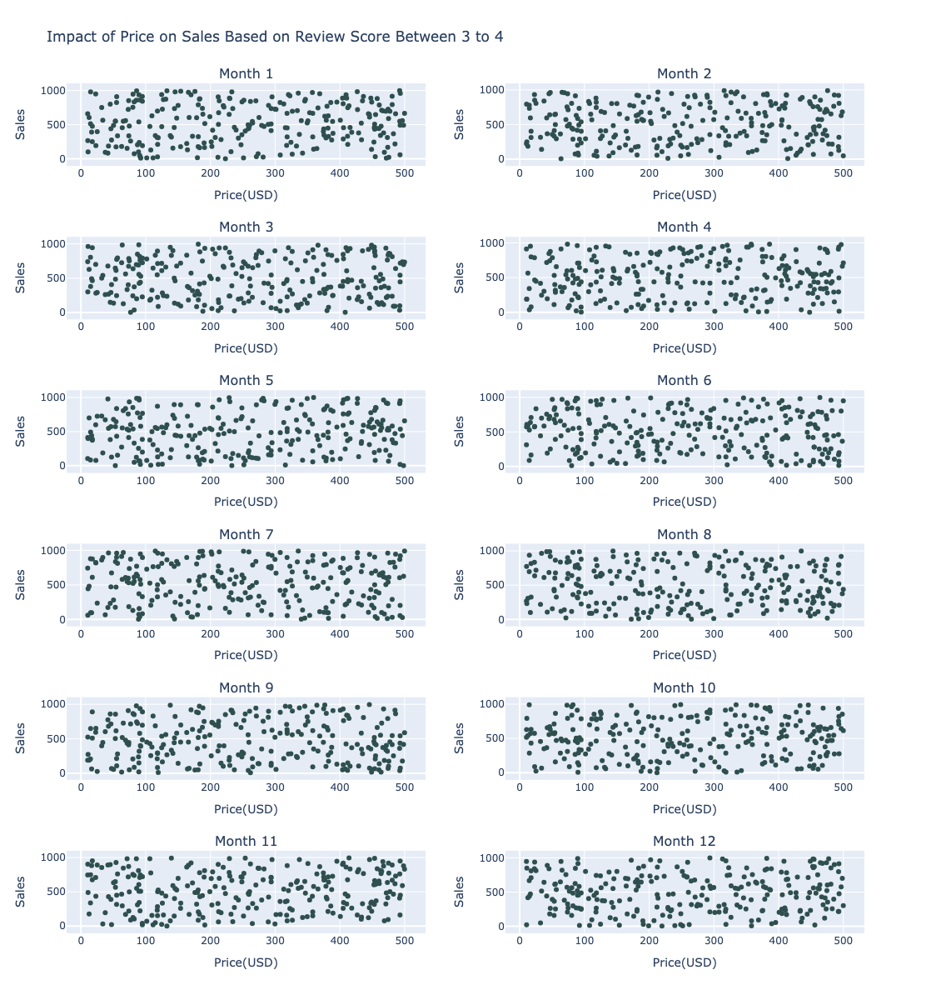

In [88]:
#Graph of impact of price on sales with review score of 3 to 4
fig = make_subplots(rows = 6, cols = 2,
                   subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                     'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                     'Month 9', 'Month 10', 'Month 11', 'Month 12'))

fig1 = px.scatter(review_4, y = 'sales_month_1', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =1)

fig1 = px.scatter(review_4, y = 'sales_month_2', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =2)

fig1 = px.scatter(review_4, y = 'sales_month_3', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =1)
    
fig1 = px.scatter(review_4, y = 'sales_month_4', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =2)
fig1 = px.scatter(review_4, y = 'sales_month_5', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =1)
    
fig1 = px.scatter(review_4, y = 'sales_month_6', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =2)
    
fig1 = px.scatter(review_4, y = 'sales_month_7', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =1)
    
fig1 = px.scatter(review_4, y = 'sales_month_8', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =2)
    
fig1 = px.scatter(review_4, y = 'sales_month_9', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =1)
    
fig1 = px.scatter(review_4, y = 'sales_month_10', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =2)
fig1 = px.scatter(review_4, y = 'sales_month_11', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =1)
    
fig1 = px.scatter(review_4, y = 'sales_month_12', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =2)
                    
fig.update_traces(marker_color = 'darkslategray')
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Impact of Price on Sales Based on Review Score Between 3 to 4',
                  height = 1200, width = 900)

fig.show()

In [89]:
#Review score between 4 and 5
review_5 = df[(df['review_score'] > 4) & (df['review_score']<= 5)] 
review_5

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
2,3,Product_3,Toys,367.34,4.5,163,348,558,567,143,771,409,290,828,340,667,267,392,5580
4,5,Product_5,Books,82.23,4.2,220,682,451,649,301,620,293,411,258,854,548,770,257,6094
7,8,Product_8,Electronics,433.76,4.4,906,905,83,48,926,94,555,280,102,202,753,376,445,4769
11,12,Product_12,Health,485.11,5.0,991,276,214,991,906,495,374,962,100,201,819,491,132,5961
12,13,Product_13,Electronics,417.06,4.8,618,975,525,35,886,190,445,702,197,329,100,392,442,5218
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
978,979,Product_979,Clothing,250.70,4.5,840,282,357,146,515,111,28,6,588,430,646,911,230,4250
979,980,Product_980,Home & Kitchen,300.44,4.4,116,139,727,489,190,7,371,271,410,293,845,821,967,5530
981,982,Product_982,Sports,386.60,4.2,849,901,927,158,520,476,96,15,383,752,436,111,245,5020
990,991,Product_991,Toys,400.71,4.1,323,58,583,180,888,853,101,784,994,53,540,792,802,6628


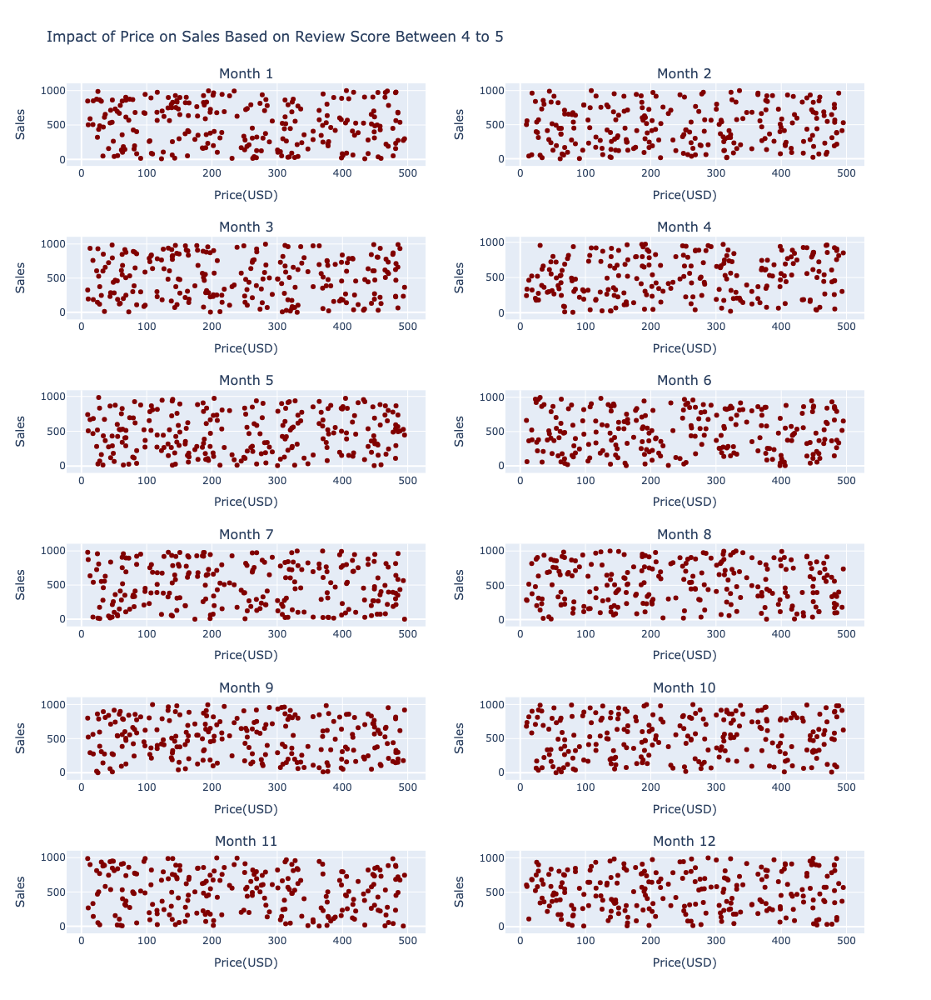

In [92]:
#Graph of Impact of price on sales based on review score of 4 to 5 over the past year
fig =make_subplots(rows = 6, cols = 2, 
                   subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                     'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                     'Month 9', 'Month 10', 'Month 11', 'Month 12'))

fig1 = px.scatter(review_5, y = 'sales_month_1', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =1)

fig1 = px.scatter(review_5, y = 'sales_month_2', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =1, col =2)

fig1 = px.scatter(review_5, y = 'sales_month_3', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =1)
fig1 = px.scatter(review_5, y = 'sales_month_4', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =2, col =2)
    
fig1 = px.scatter(review_5, y = 'sales_month_5', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =1)
    
fig1 = px.scatter(review_5, y = 'sales_month_6', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =3, col =2)
    
fig1 = px.scatter(review_5, y = 'sales_month_7', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =1)
    
fig1 = px.scatter(review_5, y = 'sales_month_8', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =4, col =2)
    
fig1 = px.scatter(review_5, y = 'sales_month_9', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =1)
fig1 = px.scatter(review_5, y = 'sales_month_10', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =5, col =2)
    
fig1 = px.scatter(review_5, y = 'sales_month_11', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =1)
    
fig1 = px.scatter(review_5, y = 'sales_month_12', x = 'price')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row =6, col =2)
                    
fig.update_traces(marker_color = 'maroon')
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Impact of Price on Sales Based on Review Score Between 4 to 5',
                  height = 1200, width = 900)

fig.show()

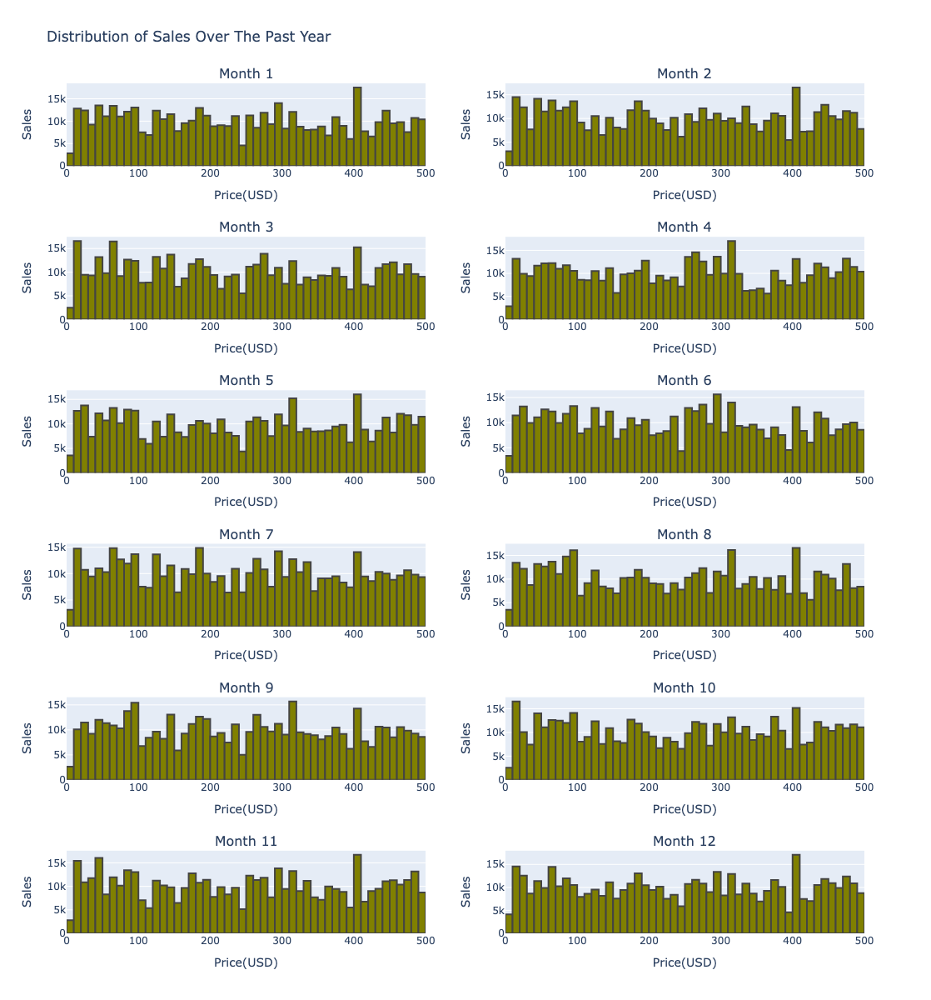

In [94]:
#Graph of Distribution of Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(df, x = 'price', y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(df, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(df, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(df, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(df, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(df, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(df, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(df, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(df, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(df, x = 'price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(df, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)

fig1 = px.histogram(df, x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'olive', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales Over The Past Year',
                  height = 1200, width = 900)
fig.show()

In [96]:
#Exploring product category electronics
electronics = df[df['category'] == 'Electronics']
electronics

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
6,7,Product_7,Electronics,33.75,3.8,632,565,140,539,244,188,700,896,965,447,66,32,516,5298
7,8,Product_8,Electronics,433.76,4.4,906,905,83,48,926,94,555,280,102,202,753,376,445,4769
8,9,Product_9,Electronics,302.55,2.0,848,809,693,419,106,616,85,42,992,696,298,213,708,5677
12,13,Product_13,Electronics,417.06,4.8,618,975,525,35,886,190,445,702,197,329,100,392,442,5218
26,27,Product_27,Electronics,103.84,4.4,441,263,568,789,320,652,69,229,633,804,167,196,645,5335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
957,958,Product_958,Electronics,28.25,2.7,704,518,308,49,645,865,470,994,731,186,24,114,28,4932
966,967,Product_967,Electronics,360.93,1.7,82,209,914,953,286,651,146,343,597,639,94,949,440,6221
975,976,Product_976,Electronics,134.82,4.8,48,564,762,606,328,521,893,382,288,765,494,166,88,5857
988,989,Product_989,Electronics,126.97,2.7,575,117,637,338,142,753,550,938,368,374,911,104,127,5359


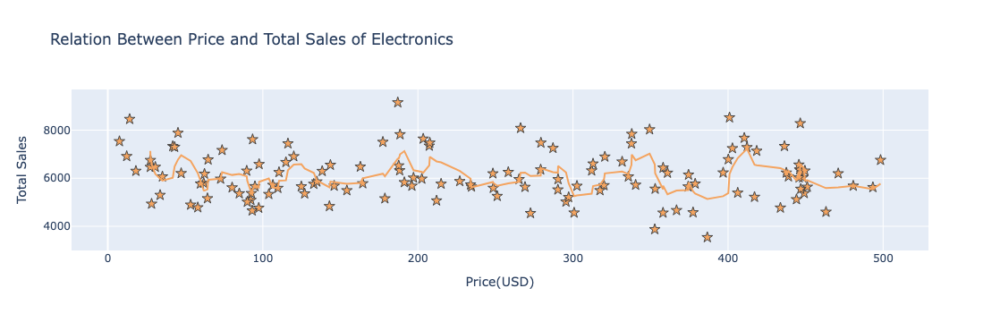

In [98]:
fig = px.scatter(electronics, x = 'price', y = 'total_sales', trendline = 'rolling',
                trendline_options = dict(window = 5), title = 'Relation Between Price and Total Sales of Electronics')
fig.update_traces(marker_color = 'sandybrown', marker_symbol = 'star', marker_size = 9,
                 marker_line_width = 1)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Total Sales')
fig.show()

Exploring Monthwise

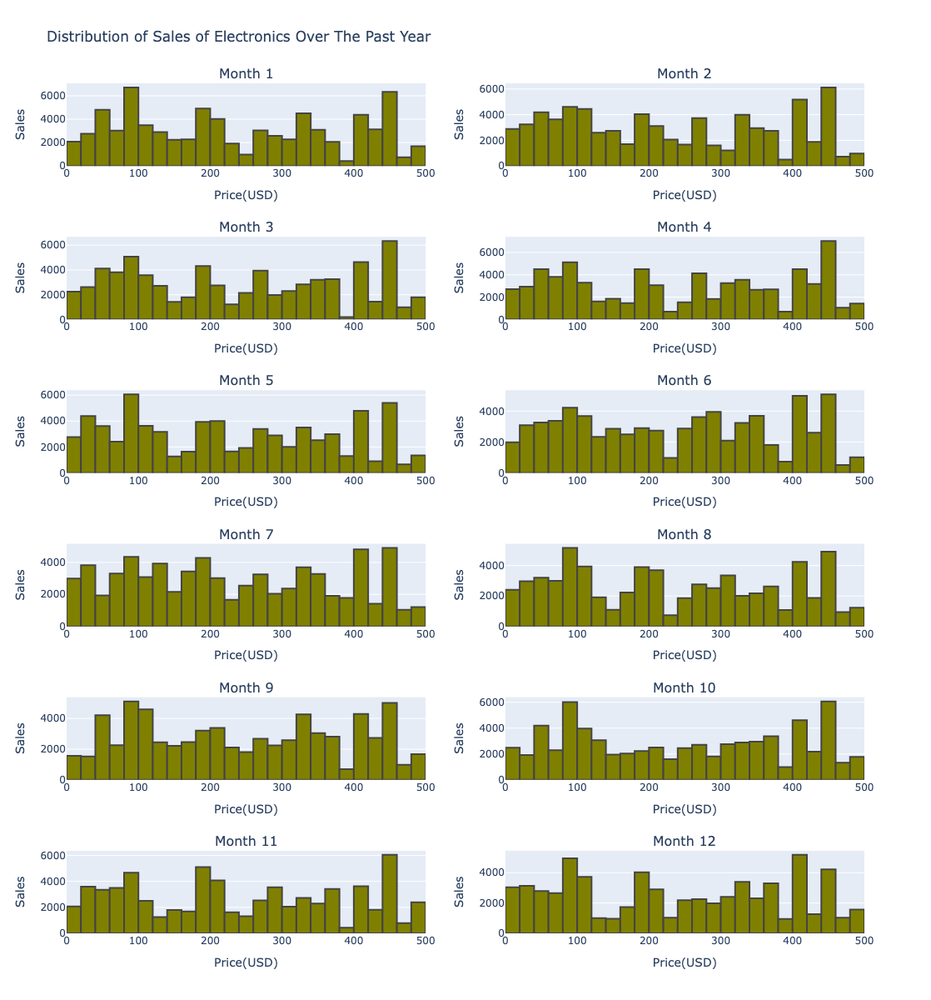

In [101]:
#Graph of Distribution of Electronics Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(electronics, x ='price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)
fig1 = px.histogram(electronics, x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'olive', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales of Electronics Over The Past Year',
                  height = 1200, width = 900)
fig.show()

In [103]:
#Exploring product category clothing
clothing = df[df['category'] == 'Clothing']
clothing

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
0,1,Product_1,Clothing,190.40,1.7,220,479,449,92,784,604,904,446,603,807,252,695,306,6421
9,10,Product_10,Clothing,355.50,3.0,400,319,390,636,87,7,555,485,566,632,462,561,179,4879
14,15,Product_15,Clothing,95.00,3.8,205,193,402,793,3,767,389,897,225,891,331,721,252,5864
20,21,Product_21,Clothing,307.87,3.8,696,56,28,165,606,484,562,969,909,886,380,172,207,5424
24,25,Product_25,Clothing,230.75,4.8,250,18,713,375,347,163,916,929,813,248,108,557,306,5493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,941,Product_941,Clothing,140.66,1.2,620,591,211,691,181,870,659,465,665,880,512,699,659,7083
955,956,Product_956,Clothing,194.65,4.7,923,996,379,287,892,80,549,730,339,599,135,454,409,5849
967,968,Product_968,Clothing,152.08,2.4,604,499,493,835,9,840,904,852,635,27,544,426,770,6834
978,979,Product_979,Clothing,250.70,4.5,840,282,357,146,515,111,28,6,588,430,646,911,230,4250


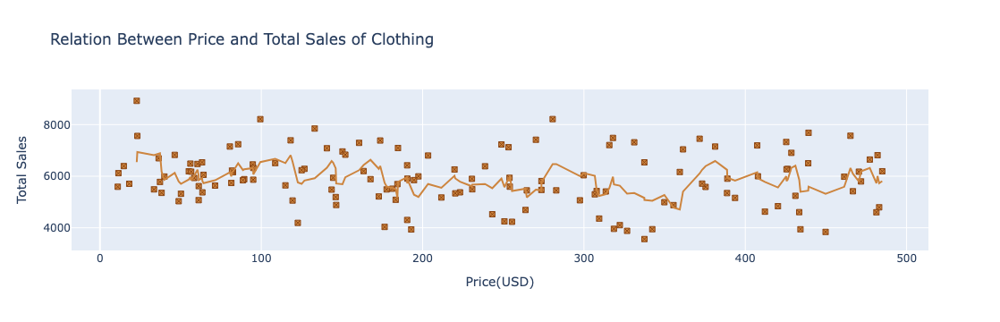

In [105]:
fig = px.scatter(clothing, x = 'price', y = 'total_sales', title = 'Relation Between Price and Total Sales of Clothing',
                trendline = 'rolling', trendline_options = dict(window = 5))
fig.update_traces(marker_color = 'peru', marker_line_color = 'saddlebrown', marker_symbol = 'square-x',
                 marker_line_width = 1)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Total Sales')
fig.show()


Exploring Monthwise

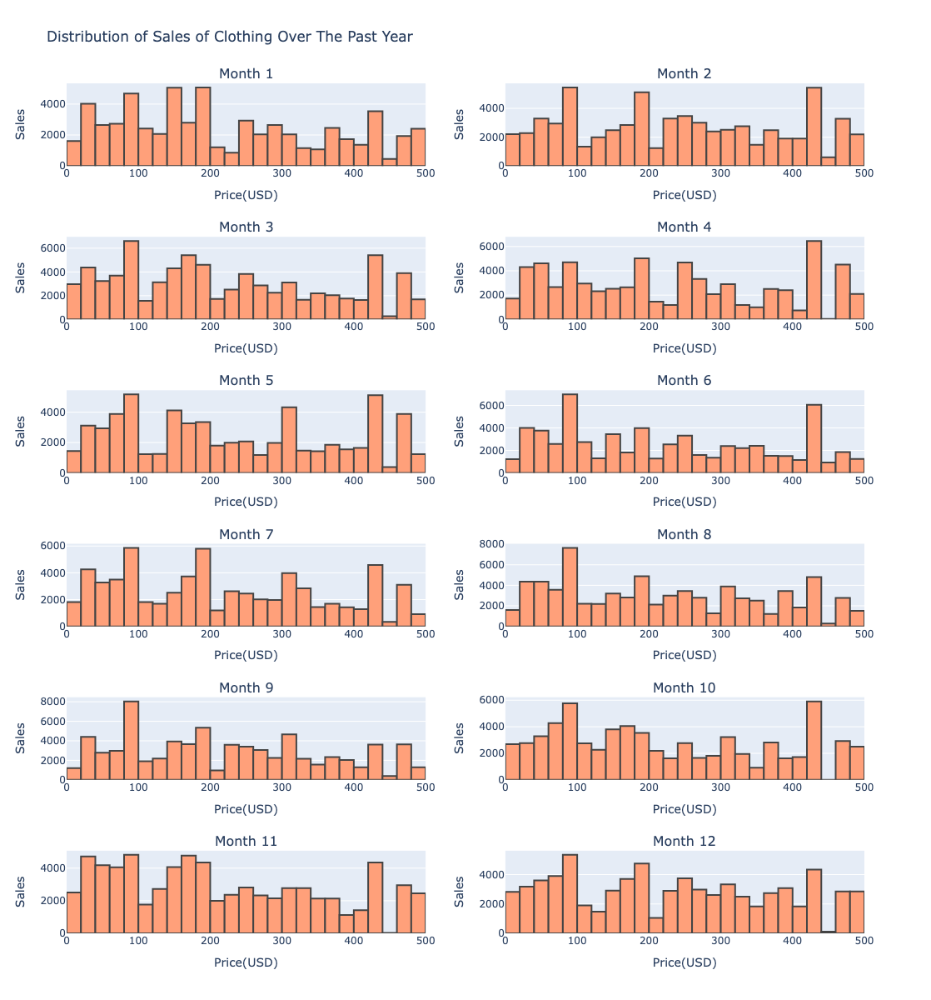

In [108]:
#Graph of Distribution of Clothing Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)
fig1 = px.histogram(clothing, x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'lightsalmon', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales of Clothing Over The Past Year',
                  height = 1200, width = 900)
fig.show()


In [110]:
#Exploring product category home and kitchen
home_kitchen = df[df['category'] == 'Home & Kitchen']
home_kitchen

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
1,2,Product_2,Home & Kitchen,475.60,3.2,903,21,989,861,863,524,128,610,436,176,294,772,353,6027
17,18,Product_18,Home & Kitchen,264.75,3.3,841,546,476,222,878,116,241,491,236,215,392,38,661,4512
19,20,Product_20,Home & Kitchen,149.16,1.1,228,285,403,959,907,610,919,959,120,554,873,611,137,7337
35,36,Product_36,Home & Kitchen,405.16,3.8,399,291,569,452,771,757,951,48,909,124,527,918,186,6503
36,37,Product_37,Home & Kitchen,155.78,2.4,978,24,324,191,107,823,731,494,231,78,277,922,830,5032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,992,Product_992,Home & Kitchen,348.87,1.6,443,32,295,287,819,660,45,287,559,275,143,958,618,4978
992,993,Product_993,Home & Kitchen,139.71,3.4,837,317,235,833,68,235,65,808,702,334,587,991,127,5302
993,994,Product_994,Home & Kitchen,297.16,1.5,13,49,55,186,246,305,602,133,461,30,656,413,706,3842
995,996,Product_996,Home & Kitchen,50.33,3.6,494,488,359,137,787,678,970,282,155,57,575,634,393,5515


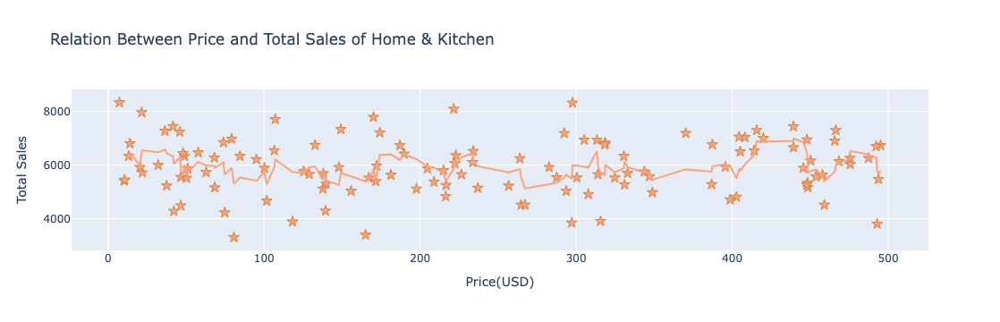

In [112]:
fig = px.scatter(home_kitchen, x = 'price', y = 'total_sales', title = 'Relation Between Price and Total Sales of Home & Kitchen',
                trendline = 'rolling', trendline_options = dict(window = 5))
fig.update_traces(marker_color = 'lightsalmon', marker_line_color = 'peru', 
                  marker_symbol = 'star', marker_line_width = 1, marker_size = 9)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Total Sales')
fig.show()

Exploring Monthwise

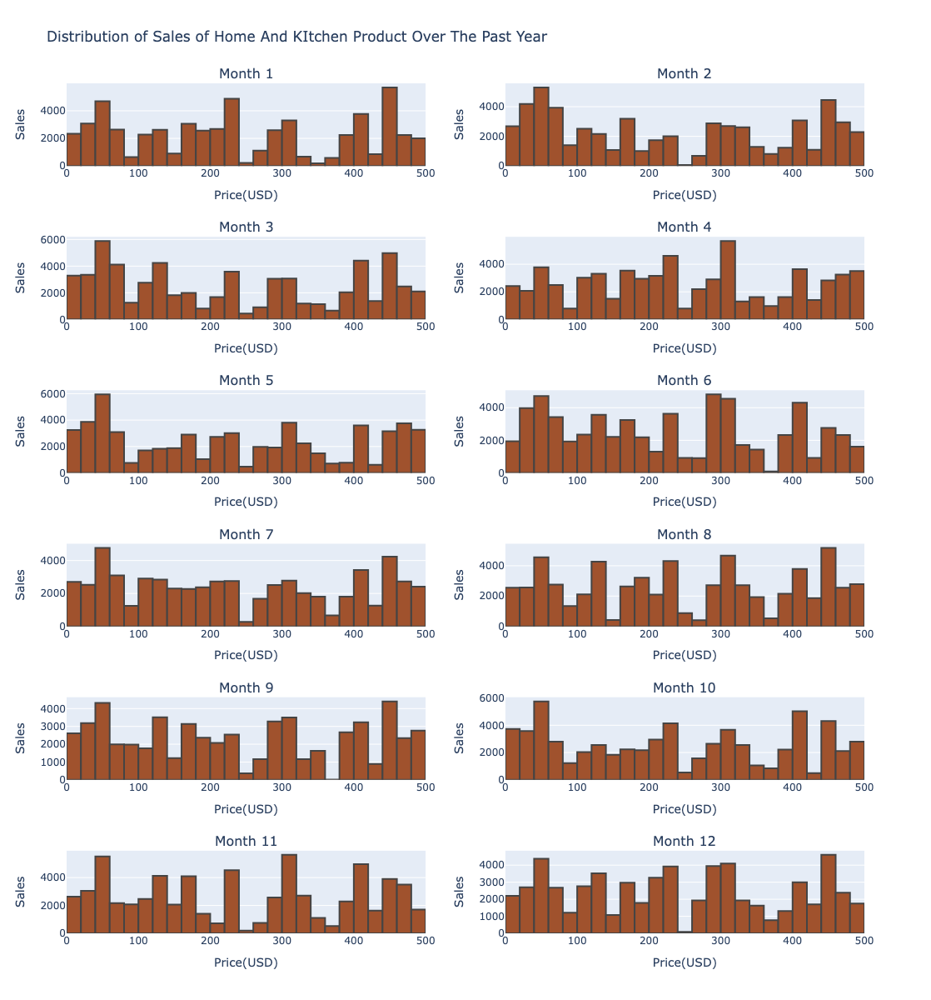

In [115]:
#Graph of Distribution of Home and kitche Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(home_kitchen, x = 'price', y =  'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)
fig1 = px.histogram(home_kitchen, x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'sienna', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales of Home And KItchen Product Over The Past Year',
                  height = 1200, width = 900)
fig.show()

In [117]:
#Exploring product category toys
toys = df[df['category'] == 'Toys']
toys

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
2,3,Product_3,Toys,367.34,4.5,163,348,558,567,143,771,409,290,828,340,667,267,392,5580
3,4,Product_4,Toys,301.34,3.9,951,725,678,59,15,937,421,670,933,56,157,168,203,5022
5,6,Product_6,Toys,82.22,3.6,270,834,288,38,422,329,245,614,979,851,630,738,485,6453
10,11,Product_11,Toys,15.19,1.9,182,125,590,12,128,66,841,595,768,737,724,439,341,5366
16,17,Product_17,Toys,155.60,1.7,556,663,821,515,409,989,50,125,462,355,750,28,92,5259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
947,948,Product_948,Toys,450.51,1.6,228,451,824,549,929,213,922,529,227,883,591,761,769,7648
976,977,Product_977,Toys,299.56,2.0,511,330,275,134,478,468,2,880,900,988,37,584,827,5903
986,987,Product_987,Toys,345.76,3.9,840,845,898,188,208,751,992,20,626,973,549,650,416,7116
990,991,Product_991,Toys,400.71,4.1,323,58,583,180,888,853,101,784,994,53,540,792,802,6628


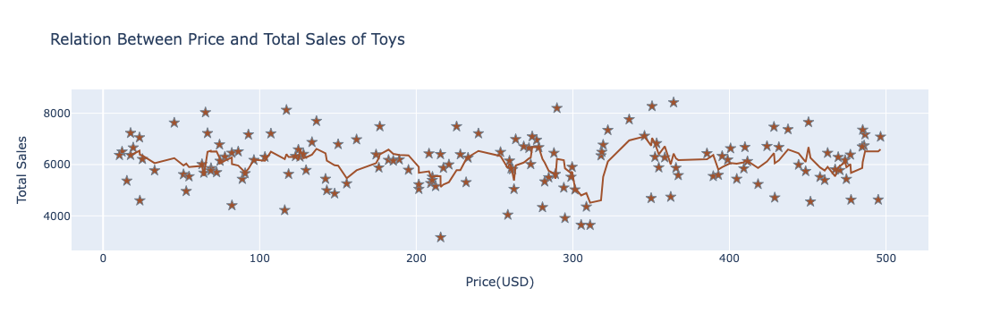

In [119]:
fig = px.scatter(toys, x = 'price', y = 'total_sales', title = 'Relation Between Price and Total Sales of Toys',
                trendline = 'rolling', trendline_options = dict(window = 5))
fig.update_traces(marker_color = 'sienna', marker_line_color = 'slategray', 
                  marker_symbol = 'star', marker_line_width = 1, marker_size = 9)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Total Sales')
fig.show()

Exploring Monthwise

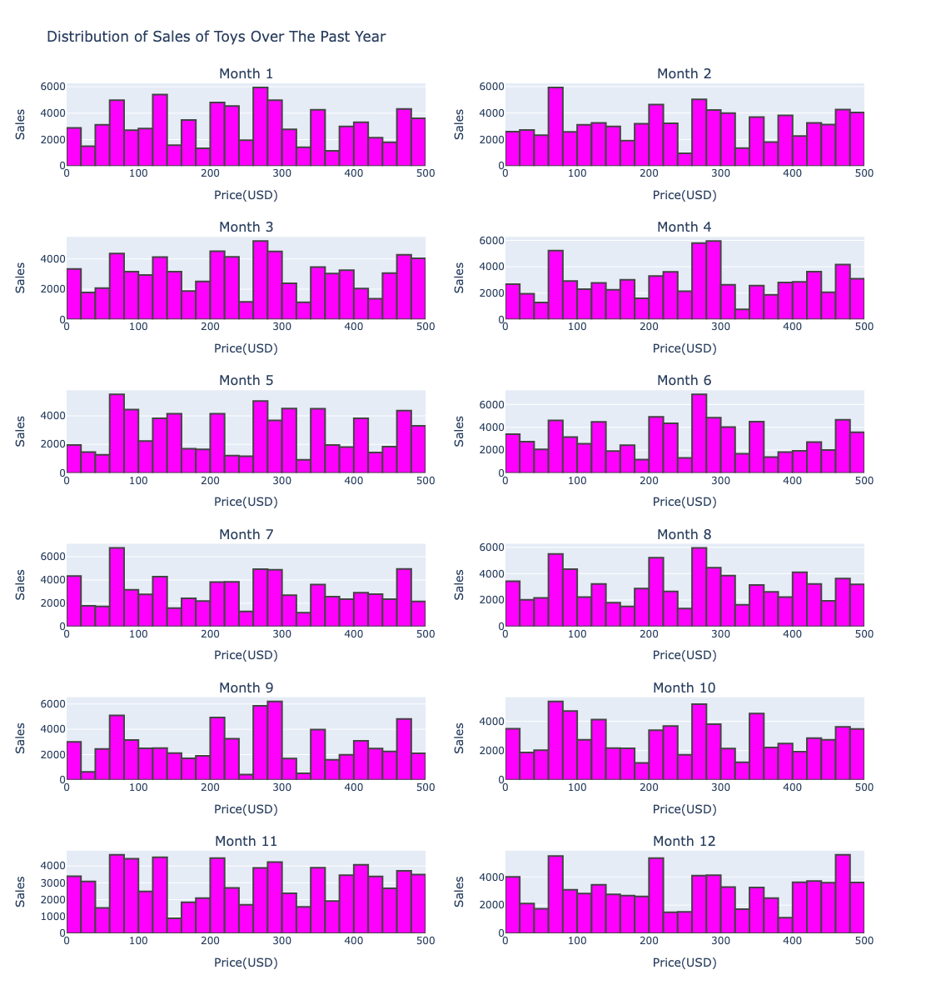

In [122]:
#Graph of Distribution of Toys Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(toys, x = 'price', y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(toys, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(toys, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(toys, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(toys, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(toys, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(toys, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(toys, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(toys, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(toys, x = 'price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(toys, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)
fig1 = px.histogram(toys,x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'fuchsia', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales of Toys Over The Past Year',
                  height = 1200, width = 900)
fig.show()


In [124]:
#Exploring product category books
books = df[df['category'] == 'Books']
books

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
4,5,Product_5,Books,82.23,4.2,220,682,451,649,301,620,293,411,258,854,548,770,257,6094
13,14,Product_14,Books,110.11,1.2,729,203,214,100,340,365,377,50,812,362,55,488,835,4201
15,16,Product_16,Books,95.79,4.7,582,680,127,85,326,520,656,209,942,453,835,945,264,6042
18,19,Product_19,Books,218.81,4.7,813,695,759,337,305,266,293,508,25,971,742,858,410,6169
21,22,Product_22,Books,74.05,2.2,619,733,791,382,720,508,265,580,505,22,91,16,636,5249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
956,957,Product_957,Books,261.86,3.6,715,839,742,387,44,329,452,325,412,10,386,905,26,4857
961,962,Product_962,Books,303.56,2.6,465,450,784,854,863,306,910,595,472,296,679,857,252,7318
963,964,Product_964,Books,197.70,2.5,949,783,809,586,47,446,153,707,352,955,337,817,59,6051
971,972,Product_972,Books,468.73,4.3,772,992,70,588,955,650,636,217,557,427,952,277,571,6892


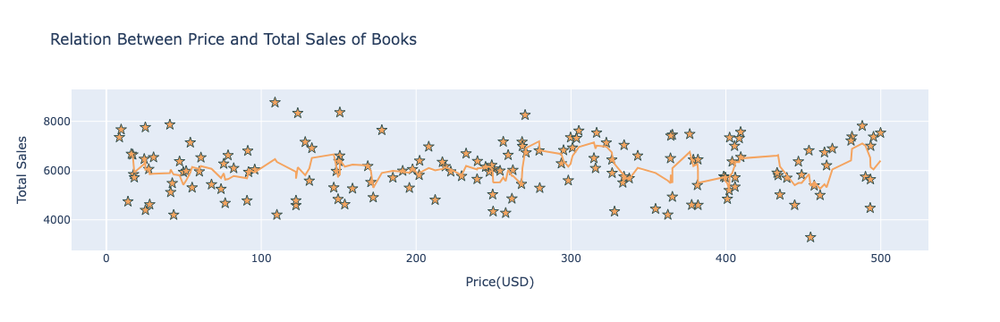

In [126]:
fig = px.scatter(books, x = 'price', y = 'total_sales', title = 'Relation Between Price and Total Sales of Books',
                trendline = 'rolling', trendline_options = dict(window = 5))
fig.update_traces(marker_color = 'sandybrown', marker_line_color = 'darkslategrey', 
                  marker_symbol = 'star', marker_line_width = 1, marker_size = 9)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Total Sales')
fig.show()

Exploring Monthwise

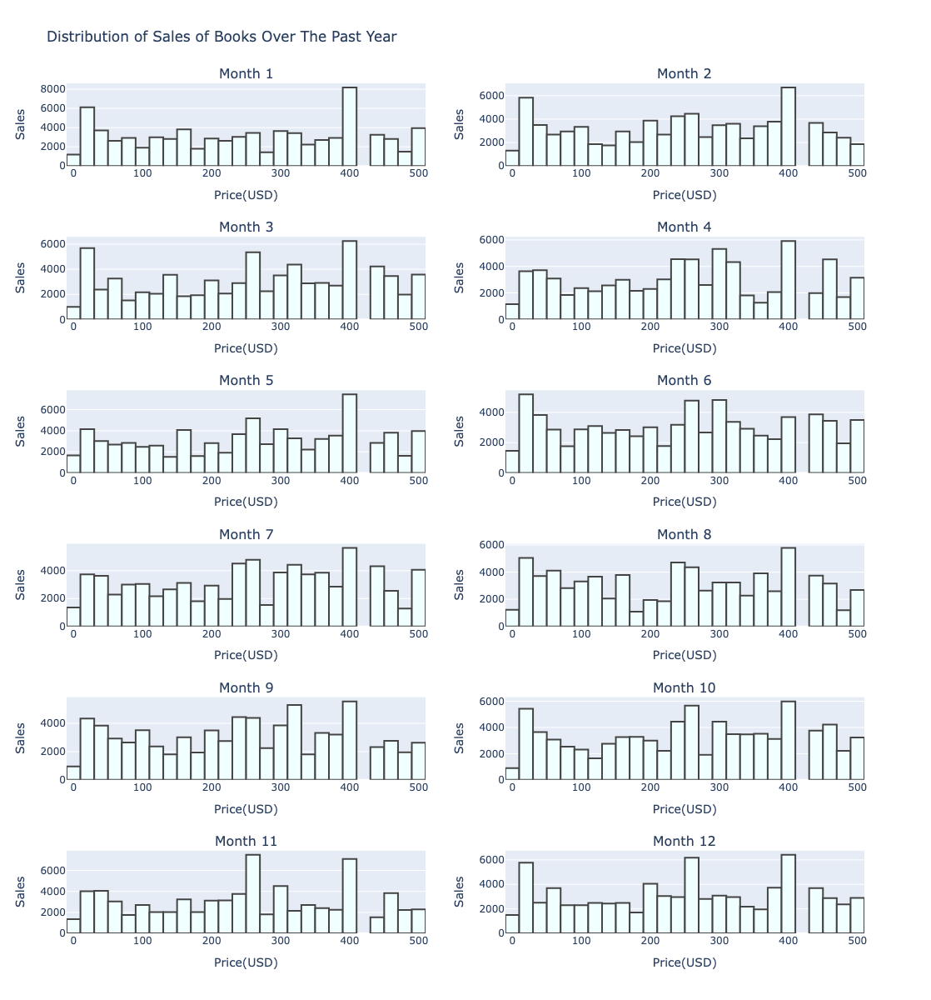

In [129]:
#Graph of Distribution of Books Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(books, x = 'price', y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(books, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(books, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(books, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(books, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(books, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(books, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(books, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(books, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(books, x = 'price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(books, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)

fig1 = px.histogram(books,x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
fig.update_traces(marker_color = 'azure', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales of Books Over The Past Year',
                  height = 1200, width = 900)
fig.show()

In [131]:
#Exploring product category health
health = df[df['category'] == 'Health']
health

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
11,12,Product_12,Health,485.11,5.0,991,276,214,991,906,495,374,962,100,201,819,491,132,5961
30,31,Product_31,Health,305.73,1.1,929,326,668,10,617,507,38,113,990,433,434,998,377,5511
48,49,Product_49,Health,275.62,4.5,492,126,203,342,489,178,543,235,287,192,918,597,690,4800
49,50,Product_50,Health,96.50,1.1,888,256,582,144,794,196,745,25,627,315,287,767,691,5429
50,51,Product_51,Health,484.94,4.5,896,675,386,64,880,734,793,583,337,301,85,720,98,5656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
950,951,Product_951,Health,302.26,1.4,417,513,606,238,871,849,518,927,45,193,849,344,957,6910
953,954,Product_954,Health,457.63,3.9,407,882,365,147,545,641,564,16,783,663,437,835,485,6363
968,969,Product_969,Health,285.37,2.3,947,463,522,988,541,1,575,522,201,576,622,41,882,5934
969,970,Product_970,Health,240.64,1.1,687,839,97,299,755,519,348,858,977,16,145,464,657,5974


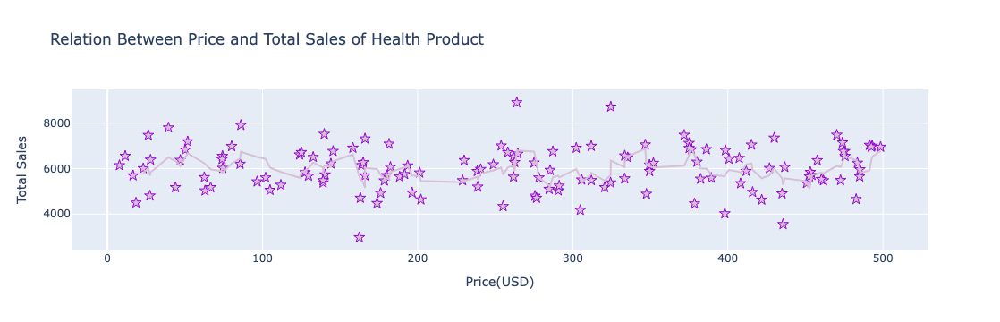

In [133]:
fig = px.scatter(health, x = 'price', y = 'total_sales', title = 'Relation Between Price and Total Sales of Health Product',
                trendline = 'rolling', trendline_options = dict(window = 5))
fig.update_traces(marker_color = 'thistle', marker_line_color = 'darkviolet', 
                  marker_symbol = 'star', marker_line_width = 1, marker_size = 9)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Total Sales')
fig.show()


Exploring Monthwise

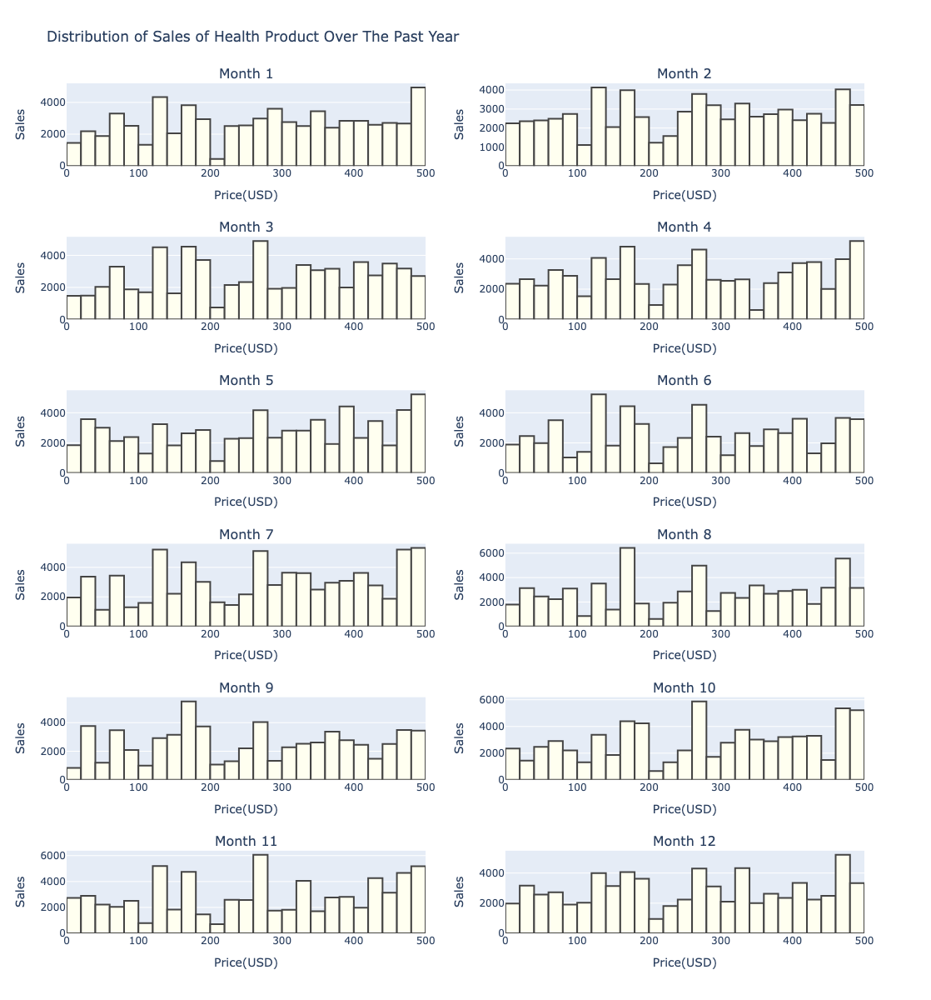

In [136]:
#Graph of Distribution of Health product Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(health, x = 'price', y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(health, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(health, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(health, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(health, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(health, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(health, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(health, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(health, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(health, x = 'price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(health, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)
fig1 = px.histogram(health,x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'ivory', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales of Health Product Over The Past Year',
                  height = 1200, width = 900)
fig.show()


In [138]:
#Exploring product category sports
sports = df[df['category'] == 'Sports']
sports

,product_id,product_name,category,price,review_score,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
23,24,Product_24,Sports,186.35,4.9,850,162,830,894,970,908,711,257,710,185,446,225,572,6870
37,38,Product_38,Sports,53.35,3.9,672,548,411,485,530,571,824,837,419,857,568,565,366,6981
43,44,Product_44,Sports,455.11,3.5,944,647,467,354,330,852,282,700,702,252,601,609,871,6667
46,47,Product_47,Sports,159.30,1.9,426,127,730,827,11,205,179,229,24,738,29,228,799,4126
52,53,Product_53,Sports,470.05,4.8,313,193,97,734,961,798,842,765,913,953,746,885,33,7920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,982,Product_982,Sports,386.60,4.2,849,901,927,158,520,476,96,15,383,752,436,111,245,5020
985,986,Product_986,Sports,250.27,1.3,864,923,83,852,387,525,410,752,750,52,159,596,476,5965
994,995,Product_995,Sports,183.68,4.0,943,879,918,883,260,477,163,983,11,134,740,428,850,6726
997,998,Product_998,Sports,72.73,1.3,287,725,109,193,657,215,337,664,476,265,344,888,654,5527


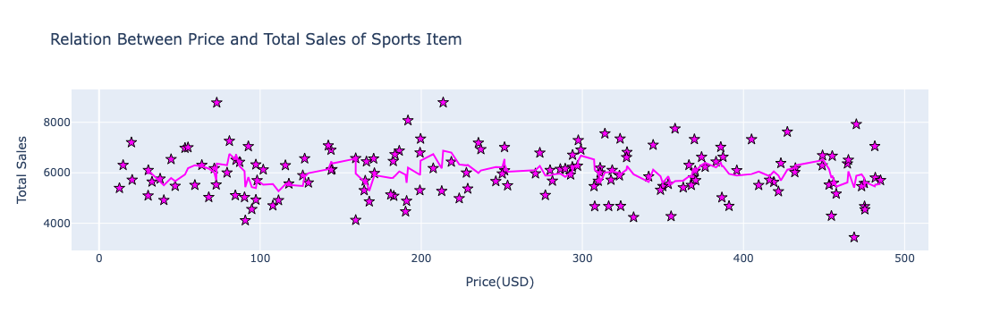

In [140]:
fig = px.scatter(sports, x = 'price', y = 'total_sales', title = 'Relation Between Price and Total Sales of Sports Item',
                trendline = 'rolling', trendline_options = dict(window = 5))
fig.update_traces(marker_color = 'fuchsia', marker_line_color = 'black', 
                  marker_symbol = 'star', marker_line_width = 1, marker_size = 9)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Total Sales')
fig.show()

Exploring Monthwise

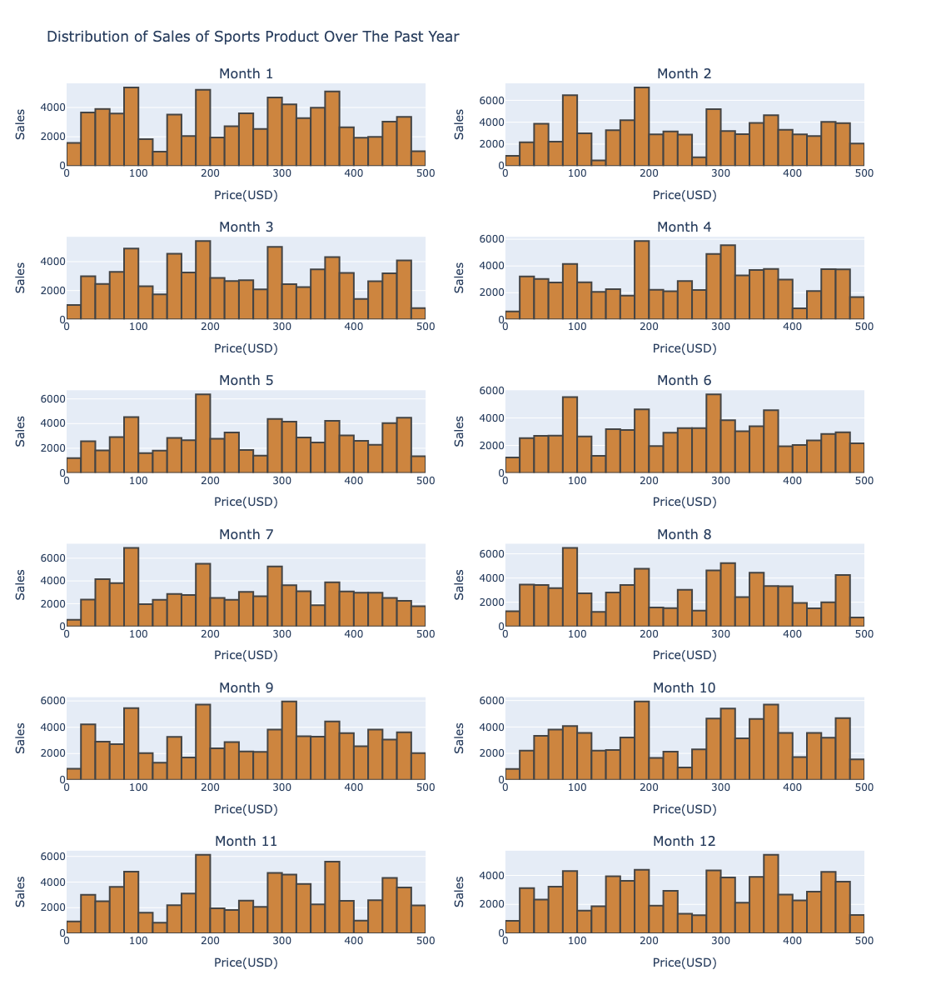

In [143]:
#Graph of Distribution of Sports Sales Over The Past Year
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.histogram(sports, x = 'price', y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.histogram(sports, x = 'price', y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.histogram(sports, x = 'price', y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.histogram(sports, x = 'price', y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.histogram(sports, x = 'price', y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.histogram(sports, x = 'price', y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.histogram(sports, x = 'price', y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.histogram(sports, x = 'price', y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.histogram(sports, x = 'price', y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.histogram(sports, x = 'price', y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.histogram(sports, x = 'price', y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)
fig1 = px.histogram(sports,x = 'price', y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'peru', marker_line_width = 2)
fig.update_xaxes(title = 'Price(USD)')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Distribution of Sales of Sports Product Over The Past Year',
                  height = 1200, width = 900)
fig.show()

Box Plot

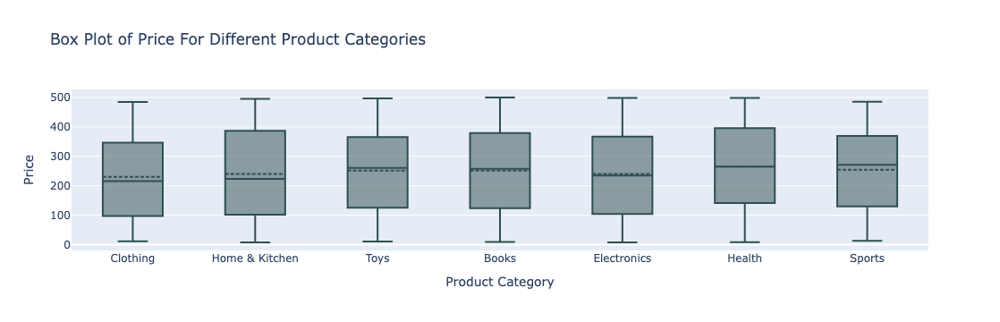

In [146]:
#Box Plot of product category based on price
fig = px.box(df, x = 'category', y = 'price', 
             title = 'Box Plot of Price For Different Product Categories')
fig.update_xaxes(title = 'Product Category')
fig.update_yaxes(title = 'Price')
fig.update_traces(boxmean = True, marker_color = 'darkslategray')
fig.show()

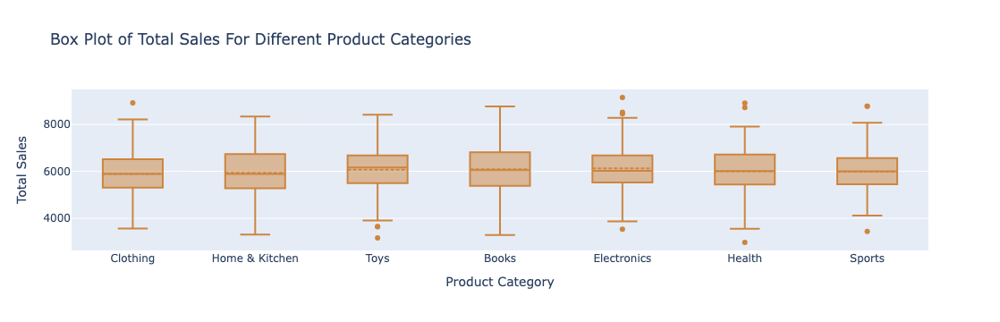

In [148]:
#Box Plot of product category based on total sales
fig = px.box(new_df, x = 'category', y = 'total_sales', 
             title = 'Box Plot of Total Sales For Different Product Categories')
fig.update_xaxes(title = 'Product Category')
fig.update_yaxes(title = 'Total Sales')
fig.update_traces(boxmean = True, marker_color = 'peru')

Review Score and Review Count

In [151]:
#Exploring review score and count
score = df.groupby('review_score').sum()
score

,product_id,product_name,category,price,review_count,sales_month_1,sales_month_2,sales_month_3,sales_month_4,sales_month_5,sales_month_6,sales_month_7,sales_month_8,sales_month_9,sales_month_10,sales_month_11,sales_month_12,total_sales
review_score,,,,,,,,,,,,,,,,,,
1.0,7153,Product_169Product_265Product_284Product_427Pr...,BooksHome & KitchenBooksSportsHome & KitchenBo...,2696.98,5856,6007,5478,6743,7228,5365,5549,5734,5506,6223,5071,5312,5895,70111
1.1,10842,Product_20Product_31Product_48Product_50Produc...,Home & KitchenHealthToysHealthBooksBooksHome &...,5739.10,14085,10563,14478,12792,14539,13416,11569,11793,13560,11111,13787,13771,11662,153041
1.2,13122,Product_14Product_73Product_101Product_195Prod...,BooksHealthSportsClothingBooksElectronicsHome ...,5386.69,13588,10223,12414,12287,12146,11264,11103,13988,13661,11331,11928,10211,12101,142657
1.3,15369,Product_35Product_39Product_127Product_133Prod...,ClothingHome & KitchenToysToysHome & KitchenBo...,6987.70,16106,17478,14665,14760,16427,13805,14234,15101,14723,12923,15742,18766,15148,183772
1.4,14071,Product_68Product_82Product_117Product_178Prod...,BooksClothingElectronicsHealthBooksClothingSpo...,7481.06,12339,12314,13706,17458,13058,14202,13358,14169,14211,11517,13155,14908,14860,166916
1.5,16152,Product_34Product_120Product_162Product_200Pro...,ToysToysToysSportsBooksClothingToysToysElectro...,7179.76,16331,16340,14657,13268,14207,14565,14865,12301,18356,15916,14458,15325,14037,178295
1.6,10169,Product_110Product_157Product_165Product_222Pr...,ElectronicsElectronicsBooksSportsToysToysBooks...,4320.98,8416,9694,11322,9225,8284,8603,9208,8814,8465,8876,9789,9839,10180,112299
1.7,13186,Product_1Product_17Product_88Product_96Product...,ClothingToysHealthBooksHome & KitchenBooksSpor...,7287.27,15641,13435,16788,14747,14613,15033,13085,12962,14452,12465,14576,13590,16695,172441
1.8,10173,Product_257Product_296Product_337Product_362Pr...,Home & KitchenToysToysSportsHealthBooksHealthH...,5090.11,8834,7965,8851,7470,8710,8107,6781,10703,9411,9993,9151,8746,6393,102281


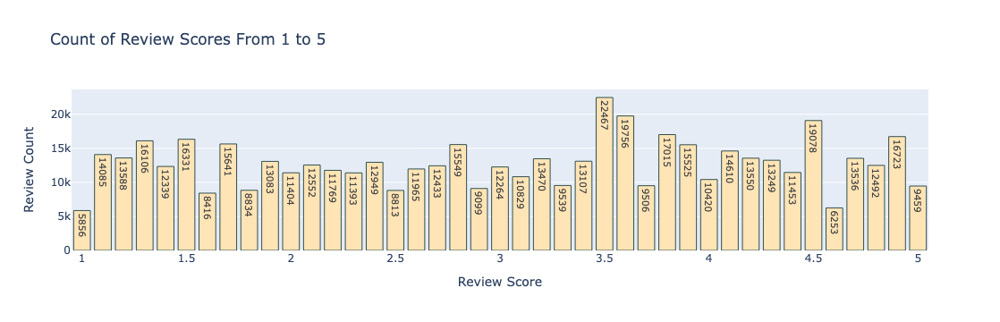

In [153]:
#Graph showing the count of review score 
fig = px.bar(score, x = score.index, y = 'review_count' ,  text_auto = '.0f', 
             title = 'Count of Review Scores From 1 to 5')
fig.update_traces(marker_color = 'moccasin', marker_line_color = 'darkslategray',
                 marker_line_width = 1)
fig.update_xaxes(title = 'Review Score')
fig.update_yaxes(title = 'Review Count')
fig.update_layout(width = 900)
fig.show()

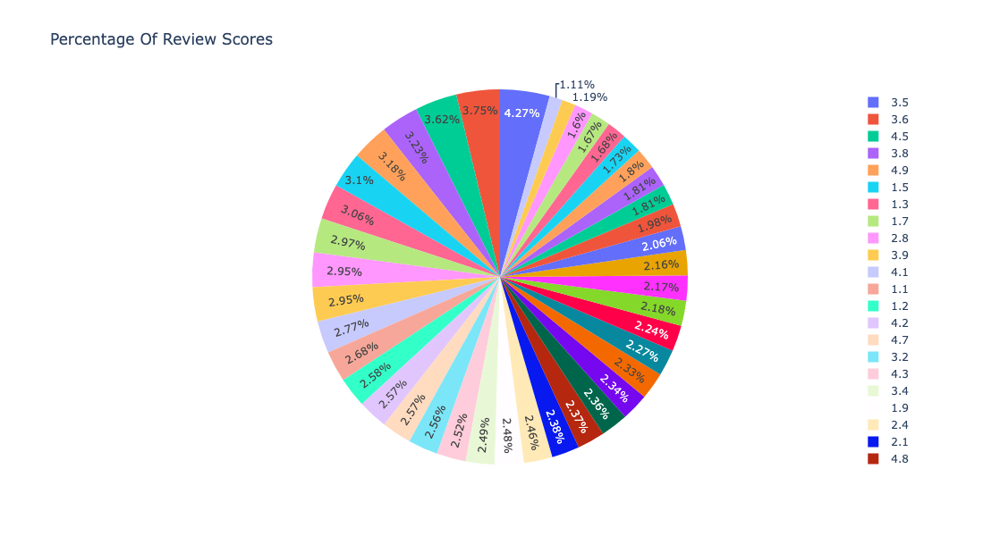

In [155]:
#Graph showing percentage of review counts
fig = px.pie(values = score['review_count'], names = score.index, 
             title = 'Percentage Of Review Scores')
fig.update_layout(height = 600)
fig.show()

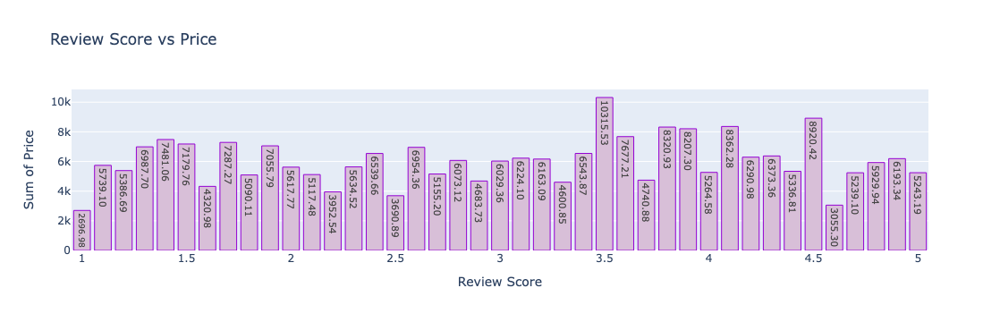

In [157]:
#Graph of review score based on price
fig = px.bar(score, x = score.index, y = 'price', title = 'Review Score vs Price',
            text_auto = '.2f')
fig.update_xaxes(title = 'Review Score')
fig.update_yaxes(title = 'Sum of Price')
fig.update_traces(marker_color = 'thistle', marker_line_width = 1,
                  marker_line_color = 'darkviolet')
fig.update_layout(width = 900)
fig.show()

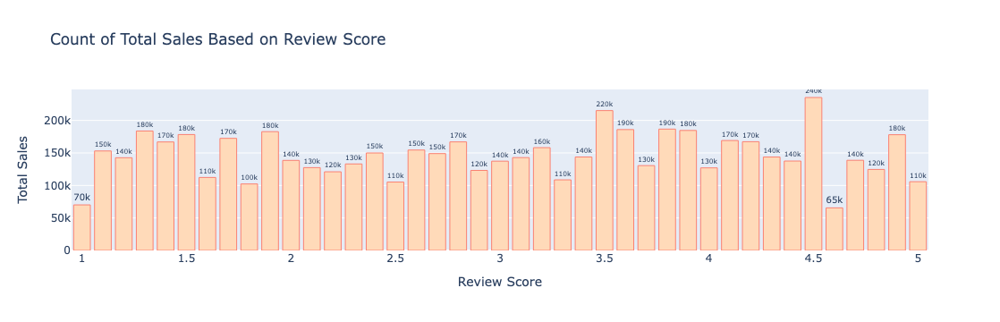

In [159]:
#Graph of total sales and review score
fig = px.bar(score, x = score.index, y = 'total_sales', text_auto = '.2s',
             title = 'Count of Total Sales Based on Review Score')
fig.update_traces(marker_color = 'peachpuff', marker_line_color = 'salmon',
                 marker_line_width = 1, textposition = 'outside')
fig.update_xaxes(title = 'Review Score')
fig.update_yaxes(title = 'Total Sales')
fig.show()

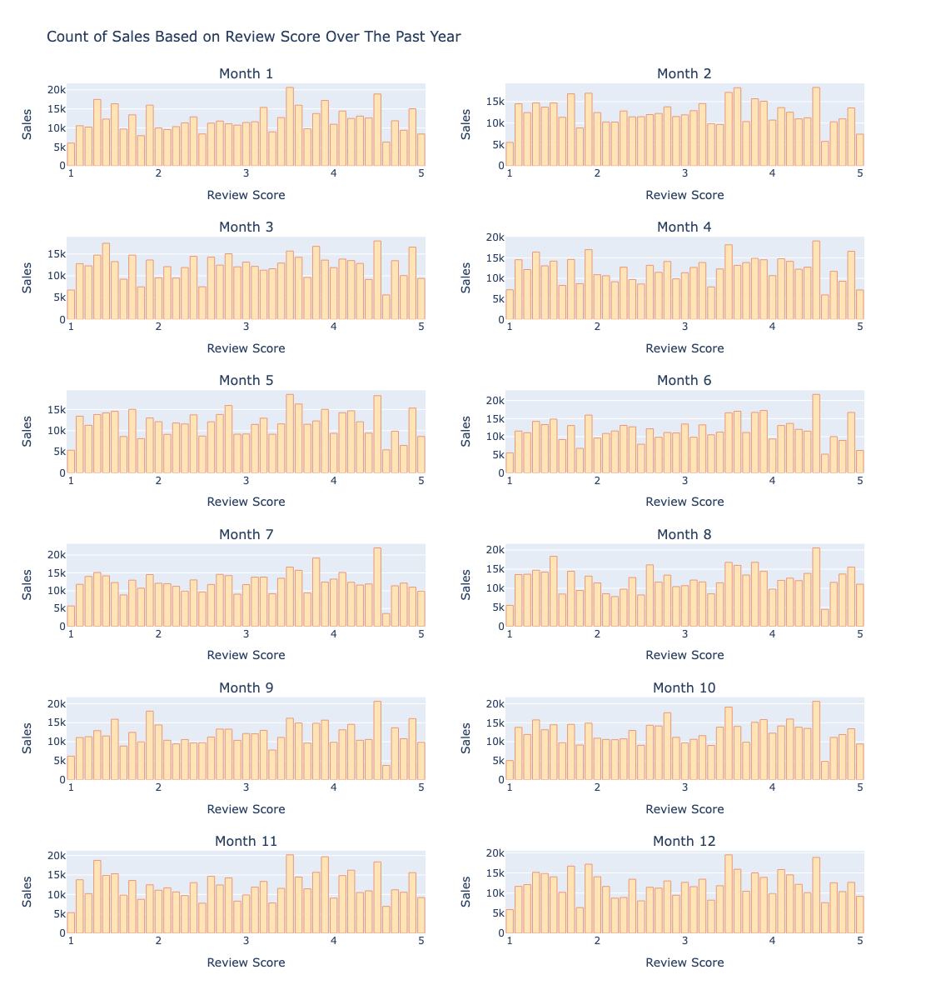

In [161]:
#Graph of Sales Over The Past Year based on review score
fig = make_subplots(rows = 6, cols = 2, 
                    subplot_titles = ('Month 1', 'Month 2', 'Month 3', 'Month 4', 
                                      'Month 5', 'Month 6', 'Month 7', 'Month 8',
                                      'Month 9', 'Month 10', 'Month 11', 'Month 12'))
fig1 = px.bar(score, x = score.index, y = 'sales_month_1')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=1)

fig1 = px.bar(score, x = score.index, y = 'sales_month_2')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=1, col=2)

fig1 = px.bar(score, x = score.index, y = 'sales_month_3')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=1)

fig1 = px.bar(score, x = score.index, y = 'sales_month_4')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=2, col=2)    

fig1 = px.bar(score, x = score.index, y = 'sales_month_5')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=1)
fig1 = px.bar(score, x = score.index, y = 'sales_month_6')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=3, col=2)
    
fig1 = px.bar(score, x = score.index, y = 'sales_month_7')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=1)
    
fig1 = px.bar(score, x = score.index, y = 'sales_month_8')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=4, col=2)
    
fig1 = px.bar(score, x = score.index, y = 'sales_month_9')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=1)
    
fig1 = px.bar(score, x = score.index, y = 'sales_month_10')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=5, col=2)
    
fig1 = px.bar(score, x = score.index, y = 'sales_month_11')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=1)
fig1 = px.bar(score, x = score.index, y = 'sales_month_12')
for trace in fig1.data:
    fig.add_trace(fig1.data[0], row=6, col=2)
    
    
fig.update_traces(marker_color = 'moccasin', marker_line_color = 'darksalmon',
                  marker_line_width = 1)
fig.update_xaxes(title = 'Review Score')
fig.update_yaxes(title = 'Sales')
fig.update_layout(title = 'Count of Sales Based on Review Score Over The Past Year',
                  height = 1200, width = 900)
fig.show()